<a href="https://colab.research.google.com/github/noviardhana/data_wizards/blob/master/Data_Wizards_stage_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Wizards

Final Project Bootcamp Rakamin Data Science Batch 31

Dataset: **Should This Loan be Approved or Denied?**

Team:
1. Tegas Gagas Impian P. N. (Project Manager)
2. Aditya Sentanu MA
3. Andri Eka Putra
4. Apip Zanariyatim
5. Arras Amirah
6. Rehan Prasetyo
7. Wika Mirna Sari

## 1. Problem definition
We assume as a loan officer who is deciding whether to approve a loan to a small business. In this case, we predict the approval (**Approved** or **not approved**) based on the attributes.

## 2. Data
This dataset can be looked at this link: https://www.kaggle.com/datasets/mirbektoktogaraev/should-this-loan-be-approved-or-denied

## 3. Features

Information about the description of features

**Create data dictionary:**
* LoanNr_ChkDgt = Identifier Primary key
* Name = Borrower name
* City = Borrower city
* State = Borrower state
* Zip	= Borrower zip code
* Bank = Bank name
* BankState = Bank state
* NAICS = North American industry classification system code
* ApprovalDate = Date SBA commitment issued
* ApprovalFY = Fiscal year of commitment
* Term = Loan term in months
* NoEmp = Number of business employees
* NewExist  -  1 = Existing business (0) , 2 = New business (1)
* CreateJob = Number of jobs created
* RetainedJob	= Number of jobs retained
* FranchiseCode =Franchise code, (00000 or 00001) = No * franchise
* UrbanRural - 1 = Urban, 2 = rural, 0 = undefined
* RevLineCr = Revolving line of credit: Y = Yes, N = No
* LowDoc = LowDoc Loan Program: Y = Yes, N = No
* ChgOffDate = The date when a loan is declared to be in * default
* DisbursementDate = Disbursement date
* DisbursementGross = Amount disbursed
* BalanceGross = Gross amount outstanding
* MIS_Status - Loan status charged off = CHGOFF (1) , Paid in full = PIF (0) (Target)
* ChgOffPrinGr = Charged-off amount
* GrAppv = Gross amount of loan approved by bank
* SBA_Appv = SBA’s guaranteed amount of approved loan

## 4. Evaluation

Evaluation metrics are:
* Accuracy (90%)
* ROC curve and AUC score
* Confusion matrix
* Precision
* Recall
* Classification report
* F1-score
* Cross-validation


## Import Library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

from sklearn.feature_selection import f_classif, chi2, SelectKBest
from sklearn.preprocessing import MinMaxScaler, StandardScaler

sns.set_style('whitegrid')

Some explaination:

1. `sklearn.feature_selection`: a library for feature selection in machine learning.

2. `f_classif`: a function from sklearn.feature_selection that computes the ANOVA F-value for each feature and returns the p-value.

3. `chi2`: a function from sklearn.feature_selection that computes the chi-squared statistic for each feature and returns the p-value.

4. `SelectKBest`: a class from sklearn.feature_selection that selects the k best features based on a scoring function.

## Import Dataset

In [2]:
#from google.colab import drive
# drive.mount('/content/drive')
# data = pd.read_csv('/content/drive/MyDrive/0. Rakamin/Data Wizards/SBAnational.csv')
# df = data.copy()

In [3]:
!gdown --id 1MDm7NhwBbuFMNNr6D8tNgG28yL6dSr1s # Download File

/usr/local/lib/python3.9/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1MDm7NhwBbuFMNNr6D8tNgG28yL6dSr1s
To: /content/SBAnational.csv
100% 179M/179M [00:01<00:00, 125MB/s]


In [4]:
data = pd.read_csv('SBAnational.csv')
df = data.copy()

<ipython-input-4-b5d574fbae84>:1: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('SBAnational.csv')


In [5]:
df

,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,...,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,1000014003,ABC HOBBYCRAFT,EVANSVILLE,IN,47711,FIFTH THIRD BANK,OH,451120,28-Feb-97,1997,...,N,Y,NaN,28-Feb-99,"$60,000.00",$0.00,P I F,$0.00,"$60,000.00","$48,000.00"
1,1000024006,LANDMARK BAR & GRILLE (THE),NEW PARIS,IN,46526,1ST SOURCE BANK,IN,722410,28-Feb-97,1997,...,N,Y,NaN,31-May-97,"$40,000.00",$0.00,P I F,$0.00,"$40,000.00","$32,000.00"
2,1000034009,"WHITLOCK DDS, TODD M.",BLOOMINGTON,IN,47401,GRANT COUNTY STATE BANK,IN,621210,28-Feb-97,1997,...,N,N,NaN,31-Dec-97,"$287,000.00",$0.00,P I F,$0.00,"$287,000.00","$215,250.00"
3,1000044001,"BIG BUCKS PAWN & JEWELRY, LLC",BROKEN ARROW,OK,74012,1ST NATL BK & TR CO OF BROKEN,OK,0,28-Feb-97,1997,...,N,Y,NaN,30-Jun-97,"$35,000.00",$0.00,P I F,$0.00,"$35,000.00","$28,000.00"
4,1000054004,"ANASTASIA CONFECTIONS, INC.",ORLANDO,FL,32801,FLORIDA BUS. DEVEL CORP,FL,0,28-Feb-97,1997,...,N,N,NaN,14-May-97,"$229,000.00",$0.00,P I F,$0.00,"$229,000.00","$229,000.00"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
899159,9995573004,FABRIC FARMS,UPPER ARLINGTON,OH,43221,JPMORGAN CHASE BANK NATL ASSOC,IL,451120,27-Feb-97,1997,...,0,N,NaN,30-Sep-97,"$70,000.00",$0.00,P I F,$0.00,"$70,000.00","$56,000.00"
899160,9995603000,FABRIC FARMS,COLUMBUS,OH,43221,JPMORGAN CHASE BANK NATL ASSOC,IL,451130,27-Feb-97,1997,...,Y,N,NaN,31-Oct-97,"$85,000.00",$0.00,P I F,$0.00,"$85,000.00","$42,500.00"
899161,9995613003,"RADCO MANUFACTURING CO.,INC.",SANTA MARIA,CA,93455,"RABOBANK, NATIONAL ASSOCIATION",CA,332321,27-Feb-97,1997,...,N,N,NaN,30-Sep-97,"$300,000.00",$0.00,P I F,$0.00,"$300,000.00","$225,000.00"
899162,9995973006,"MARUTAMA HAWAII, INC.",HONOLULU,HI,96830,BANK OF HAWAII,HI,0,27-Feb-97,1997,...,N,Y,8-Mar-00,31-Mar-97,"$75,000.00",$0.00,CHGOFF,"$46,383.00","$75,000.00","$60,000.00"


#Stage 1 - EDA

## Data analytic
1. Descriptive Statistics
2. Univariate Analysis
3. Multivariate Analysis

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 899164 entries, 0 to 899163
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   LoanNr_ChkDgt      899164 non-null  int64  
 1   Name               899150 non-null  object 
 2   City               899134 non-null  object 
 3   State              899150 non-null  object 
 4   Zip                899164 non-null  int64  
 5   Bank               897605 non-null  object 
 6   BankState          897598 non-null  object 
 7   NAICS              899164 non-null  int64  
 8   ApprovalDate       899164 non-null  object 
 9   ApprovalFY         899164 non-null  object 
 10  Term               899164 non-null  int64  
 11  NoEmp              899164 non-null  int64  
 12  NewExist           899028 non-null  float64
 13  CreateJob          899164 non-null  int64  
 14  RetainedJob        899164 non-null  int64  
 15  FranchiseCode      899164 non-null  int64  
 16  Ur

In [7]:
df.shape

(899164, 27)

Here, we notice that there are 27 different columns, and there are 899164 entries in the dataframe.

In [8]:
df.duplicated().any()

False

Here, we notice there is no duplicate data

In [9]:
df.isnull().sum()

LoanNr_ChkDgt             0
Name                     14
City                     30
State                    14
Zip                       0
Bank                   1559
BankState              1566
NAICS                     0
ApprovalDate              0
ApprovalFY                0
Term                      0
NoEmp                     0
NewExist                136
CreateJob                 0
RetainedJob               0
FranchiseCode             0
UrbanRural                0
RevLineCr              4528
LowDoc                 2582
ChgOffDate           736465
DisbursementDate       2368
DisbursementGross         0
BalanceGross              0
MIS_Status             1997
ChgOffPrinGr              0
GrAppv                    0
SBA_Appv                  0
dtype: int64

Here, we notice that there are significant number of null values in the dataframe, specifically the most in ChgOffDate column. Except for column ChgOffDate, we omitted the null value to make it easier to change the data type.

In [10]:
df.dropna(subset = ['Name', 'City', 'State', 'Bank','BankState', 'NewExist','RevLineCr', 'LowDoc', 'DisbursementDate', 'MIS_Status'],   inplace = True)

In [11]:
df['ApprovalFY'].apply(type).value_counts()

<class 'int'>    759570
<class 'str'>    126670
Name: ApprovalFY, dtype: int64

Here, in case of ApprovalFY, we have two dtypes: str and int

We need to convert into int dtype, so we need to check which unique values in the column has str dtype.

In [12]:
df.ApprovalFY.unique()

array([1997, 1980, 2006, 1998, 1999, 2000, 2001, 1972, 2003, 2004, 1978,
       1979, 1981, 2005, 1982, 1983, 1973, 1984, 2007, 1985, 1986, 1987,
       2008, 1988, 2009, 1989, 1991, 1990, 1974, 2010, 2011, 1992, 1993,
       2002, 2012, 2013, 1994, 2014, 1975, 1977, 1976, '2004', '1994',
       '1979', '1976', '1975', '1974', '1977', '1981', '1982', '1983',
       '1984', '1978', '1980', '1968', '1976A', '1969', '1995', '1970',
       '2005', '1996', '1971', 1996, 1971], dtype=object)

So, we notice that there are some rows which have the character 'A' along with the year.

In [13]:
def clean_str(x):
    if isinstance(x, str):
        return x.replace('A', '')
    return x

df.ApprovalFY = df.ApprovalFY.apply(clean_str).astype('int16')

Here, we notice that several columns which need to have a specific dtype has object, which we will need to correct by setting them with their appropriate dtype.

In [14]:
payment = ['DisbursementGross', 'BalanceGross','ChgOffPrinGr', 'GrAppv', 'SBA_Appv']

df[payment] = df[payment].applymap(lambda x: x.strip().replace('$', '').replace(',', '').replace('.00','')).astype('int')

df[payment]

,DisbursementGross,BalanceGross,ChgOffPrinGr,GrAppv,SBA_Appv
0,60000,0,0,60000,48000
1,40000,0,0,40000,32000
2,287000,0,0,287000,215250
3,35000,0,0,35000,28000
4,229000,0,0,229000,229000
...,...,...,...,...,...
899159,70000,0,0,70000,56000
899160,85000,0,0,85000,42500
899161,300000,0,0,300000,225000
899162,75000,0,46383,75000,60000


In [15]:
# Convert ApprovalDate and DisbursementDate columns to datetime values
# ChgOffDate not changed to datetime since it is not of value and will be removed later
date = ['ApprovalDate', 'DisbursementDate','ChgOffDate']

df[date] = df[date].apply(pd.to_datetime)

Here, we notice that the issue is because of the dollar symbol, because of which converts the int dtype column to object.

So we remove the symbol and convert the dtype of these columns.

In [16]:
df = df.astype({'Zip': 'str', 'NewExist': 'int8', 'UrbanRural': 'int8', 'DisbursementGross': 'float', 'BalanceGross': 'float',
                          'ChgOffPrinGr': 'float', 'GrAppv': 'float', 'SBA_Appv': 'float'})

In [17]:
df.dtypes

LoanNr_ChkDgt                 int64
Name                         object
City                         object
State                        object
Zip                          object
Bank                         object
BankState                    object
NAICS                         int64
ApprovalDate         datetime64[ns]
ApprovalFY                    int16
Term                          int64
NoEmp                         int64
NewExist                       int8
CreateJob                     int64
RetainedJob                   int64
FranchiseCode                 int64
UrbanRural                     int8
RevLineCr                    object
LowDoc                       object
ChgOffDate           datetime64[ns]
DisbursementDate     datetime64[ns]
DisbursementGross           float64
BalanceGross                float64
MIS_Status                   object
ChgOffPrinGr                float64
GrAppv                      float64
SBA_Appv                    float64
dtype: object

In [18]:
df.shape

(886240, 27)

In [19]:
df['Industry'] = df['NAICS'].astype('str').apply(lambda x: x[:2])

Here, according the file that was provided along with the dataset, we map the industry code with the industry name.

In [20]:
df['Industry'] = df['Industry'].map({
    '11': 'Agriculture / Forestry / Fishing / Hunting',
    '21': 'Mining / Quarrying / Oil&Gas Extraction',
    '22': 'Utilities',
    '23': 'Construction',
    '31': 'Manufacturing',
    '32': 'Manufacturing',
    '33': 'Manufacturing',
    '42': 'Wholesale trade',
    '44': 'Retail trade',
    '45': 'Retail trade',
    '48': 'Transportation / Warehousing',
    '49': 'Transportation / Warehousing',
    '51': 'Information',
    '52': 'Finance / Insurance',
    '53': 'Real Estate / Rental / Leasing',
    '54': 'Proffesional / Scientific / Tech.Service',
    '55': 'Management of Companies and Enterprises',
    '56': 'Administrative & Support / Waste Management / Remediation Services',
    '61': 'Educational',
    '62': 'Health Care / Social Assistance',
    '71': 'Arts / Entertainment / Recreation',
    '72': 'Accomodation / Food Services',
    '81': 'Other Services (except public admin)',
    '92': 'Public Administration'
})

# df.dropna(subset=['Industry'], inplace=True)
df['Industry'].fillna(value='Others', inplace=True)

Unknown industrial fields will be omitted to avoid errors in data interpretation

In [21]:
df.isnull().sum()

LoanNr_ChkDgt             0
Name                      0
City                      0
State                     0
Zip                       0
Bank                      0
BankState                 0
NAICS                     0
ApprovalDate              0
ApprovalFY                0
Term                      0
NoEmp                     0
NewExist                  0
CreateJob                 0
RetainedJob               0
FranchiseCode             0
UrbanRural                0
RevLineCr                 0
LowDoc                    0
ChgOffDate           725369
DisbursementDate          0
DisbursementGross         0
BalanceGross              0
MIS_Status                0
ChgOffPrinGr              0
GrAppv                    0
SBA_Appv                  0
Industry                  0
dtype: int64

In [22]:
df.shape

(886240, 28)

In [23]:
# MIS_Status
# Make Default target field based on MIS_Status where P I F = 0 and CHGOFF = 1 so we can see what features are prevalant in a defaulted loan
df['Default'] = np.where(df['MIS_Status'] == 'P I F', 0, 1)
df['Default'].value_counts()

0    730199
1    156041
Name: Default, dtype: int64

In [24]:
df.describe(include='number')

,LoanNr_ChkDgt,NAICS,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,DisbursementGross,BalanceGross,ChgOffPrinGr,GrAppv,SBA_Appv,Default
count,8.862400e+05,886240.000000,886240.000000,886240.000000,886240.000000,886240.000000,886240.000000,886240.000000,886240.000000,886240.000000,8.862400e+05,886240.000000,8.862400e+05,8.862400e+05,8.862400e+05,886240.000000
mean,4.764531e+09,399251.824562,2001.149622,110.954647,11.420650,1.279900,8.463092,10.842406,2762.323810,0.759725,2.021419e+05,3.032943,1.359378e+04,1.934997e+05,1.499839e+05,0.176071
std,2.539319e+09,263211.592441,5.880586,78.990583,74.187995,0.451509,237.301746,237.739546,12776.276419,0.646074,2.879380e+05,1452.639312,6.546616e+04,2.835053e+05,2.281694e+05,0.380881
min,1.000014e+09,0.000000,1968.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000e+03,0.000000,0.000000e+00,1.000000e+03,5.000000e+02,0.000000
25%,2.577612e+09,235310.000000,1997.000000,60.000000,2.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.283700e+04,0.000000,0.000000e+00,3.500000e+04,2.125000e+04,0.000000
50%,4.351670e+09,445310.000000,2002.000000,84.000000,4.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000e+05,0.000000,0.000000e+00,9.000000e+04,6.212550e+04,0.000000
75%,6.878439e+09,561740.000000,2006.000000,120.000000,10.000000,2.000000,1.000000,4.000000,1.000000,1.000000,2.400000e+05,0.000000,0.000000e+00,2.270000e+05,1.750000e+05,0.000000
max,9.996003e+09,928120.000000,2014.000000,569.000000,9999.000000,2.000000,8800.000000,9500.000000,99999.000000,2.000000,1.144632e+07,996262.000000,3.512596e+06,5.000000e+06,4.500000e+06,1.000000


In [25]:
df.describe(include='object')

,Name,City,State,Zip,Bank,BankState,RevLineCr,LowDoc,MIS_Status,Industry
count,886240,886240,886240,886240,886240,886240,886240,886240,886240,886240
unique,769838,32298,51,33501,5788,56,18,8,2,21
top,SUBWAY,LOS ANGELES,CA,10001,BANK OF AMERICA NATL ASSOC,CA,N,N,P I F,Others
freq,1259,11467,129398,919,86075,116737,415439,775189,730199,198267


In [26]:
df_cl = df.drop(columns = ['ChgOffDate'], axis = 1)

## Business Insight

Top Bank, BankState, City, Industry

In [27]:
df.Bank.value_counts().head(20).reset_index()

,index,Bank
0,BANK OF AMERICA NATL ASSOC,86075
1,WELLS FARGO BANK NATL ASSOC,62934
2,JPMORGAN CHASE BANK NATL ASSOC,47460
3,U.S. BANK NATIONAL ASSOCIATION,34752
4,CITIZENS BANK NATL ASSOC,33569
5,"PNC BANK, NATIONAL ASSOCIATION",27148
6,BBCN BANK,22814
7,CAPITAL ONE NATL ASSOC,22220
8,MANUFACTURERS & TRADERS TR CO,11150
9,"READYCAP LENDING, LLC",10616


In [28]:
df.State.value_counts().head(20).reset_index()

,index,State
0,CA,129398
1,TX,69348
2,NY,56869
3,FL,40673
4,PA,34398
5,OH,32200
6,IL,29149
7,MA,24737
8,MN,24129
9,NJ,23817


In [29]:
df.Industry.value_counts().reset_index()

,index,Industry
0,Others,198267
1,Retail trade,125762
2,Other Services (except public admin),71754
3,Manufacturing,67109
4,Accomodation / Food Services,67084
5,Proffesional / Scientific / Tech.Service,66951
6,Construction,65635
7,Health Care / Social Assistance,54633
8,Wholesale trade,48148
9,Administrative & Support / Waste Management / ...,32114


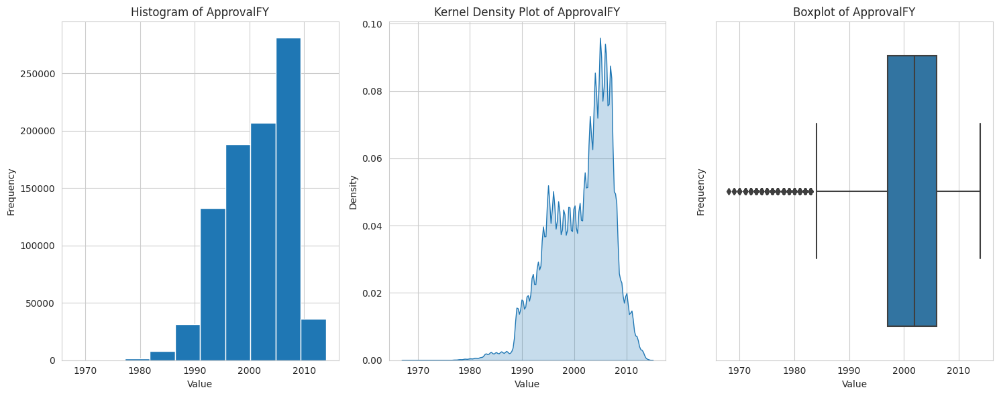

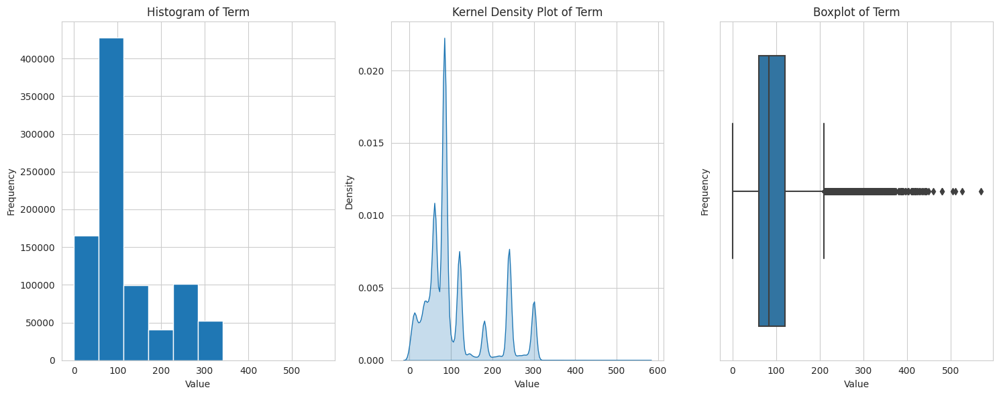

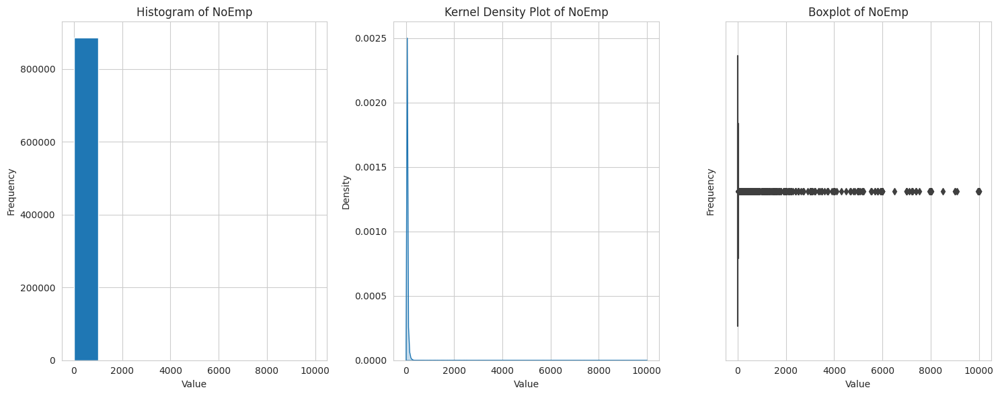

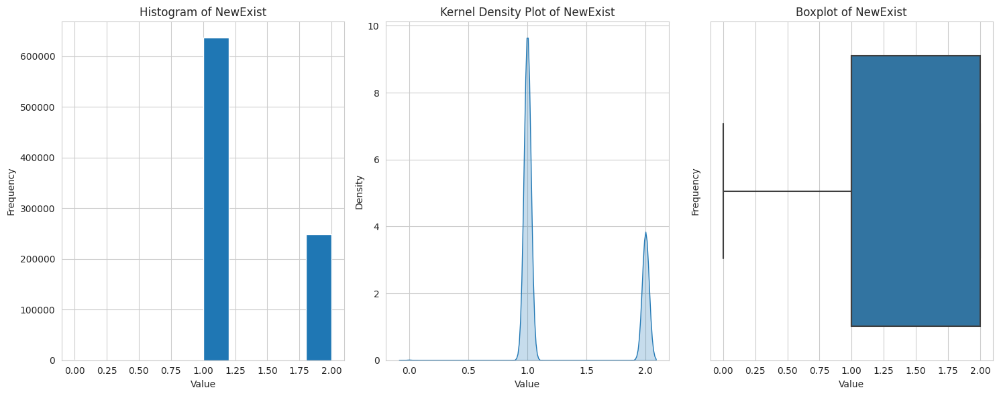

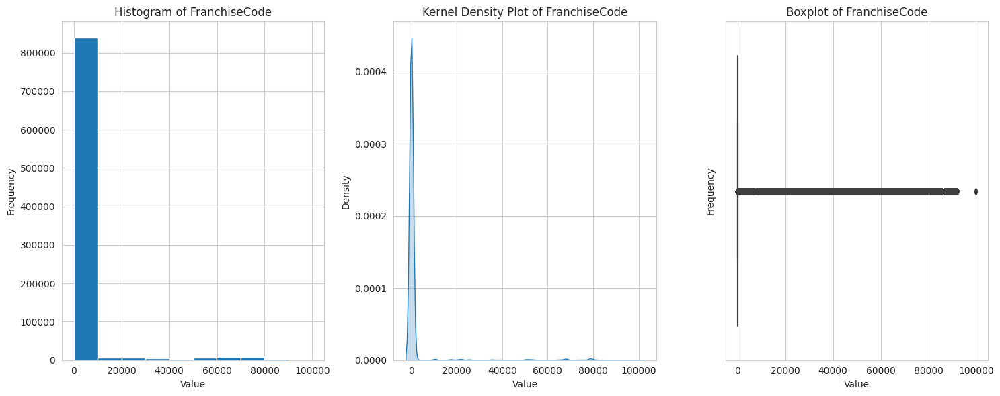

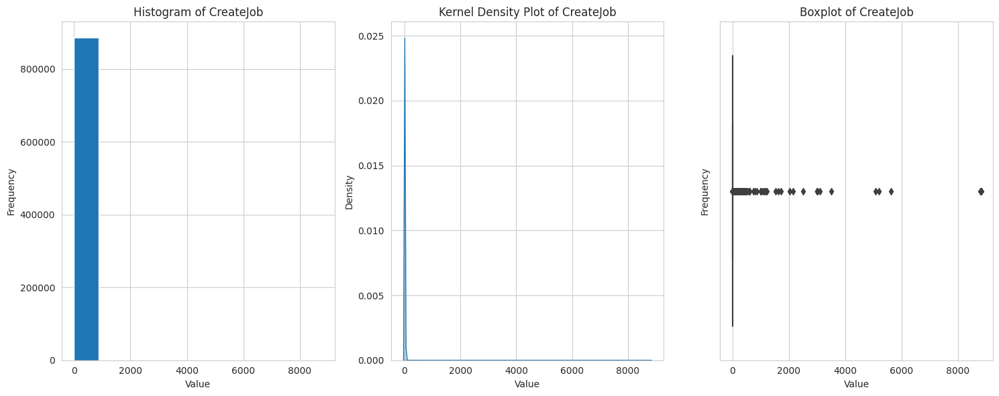

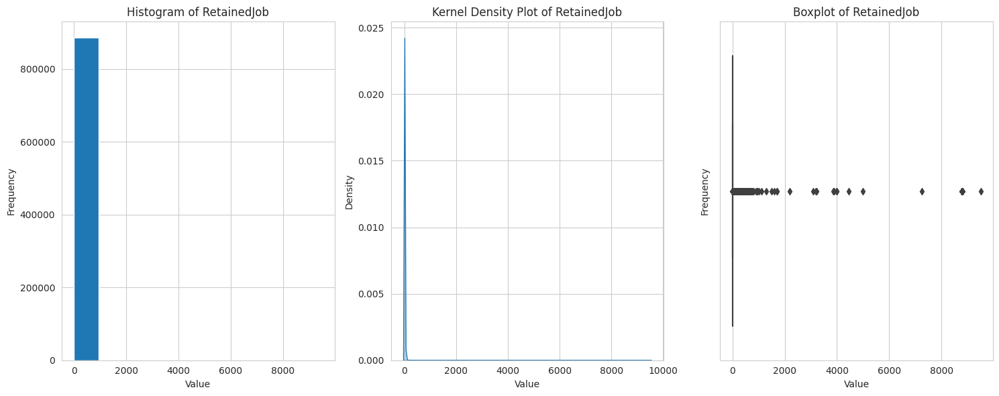

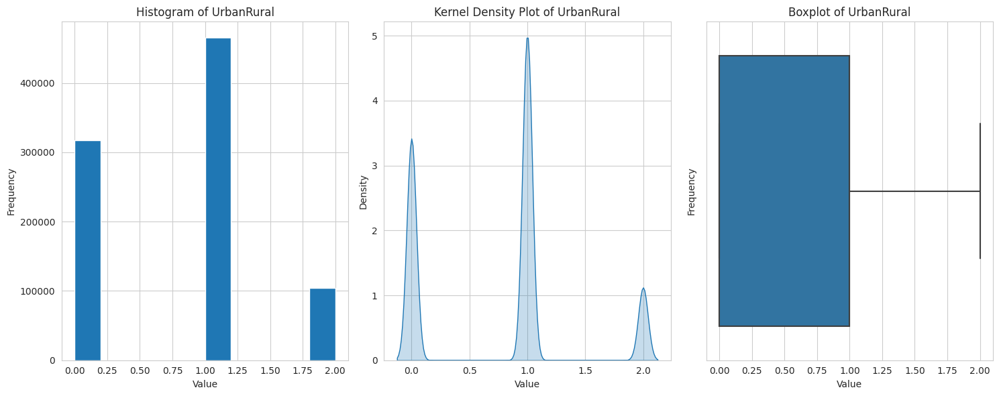

In [30]:
df_num = df[['ApprovalFY', 'Term', 'NoEmp', 'NewExist', 'FranchiseCode', 'CreateJob', 'RetainedJob', 'UrbanRural']]

# Assuming your DataFrame is named 'df'
for col in df_num.columns:
    # Create a figure with three subplots
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    # Histogram
    ax[0].hist(df_num[col], bins=10)
    ax[0].set_xlabel('Value')
    ax[0].set_ylabel('Frequency')
    ax[0].set_title('Histogram of {}'.format(col))

    # Kernel Density Plot
    sns.kdeplot(df_num[col], ax=ax[1], fill = True)
    ax[1].set_xlabel('Value')
    ax[1].set_ylabel('Density')
    ax[1].set_title('Kernel Density Plot of {}'.format(col))

    # Boxplot
    sns.boxplot(x = df_num[col], ax=ax[2])
    ax[2].set_xlabel('Value')
    ax[2].set_ylabel('Frequency')
    ax[2].set_title('Boxplot of {}'.format(col))

    # Show the plots
    plt.tight_layout()
    plt.show()

Some Insight:
1. In the **Approval data**, many banks approved projects in 2000 and reached their highest number at the end of 2000. For years under 1980, very few received approval.
2. In the **TERM table**, there is a Positive Skewed. The number of customers who make loans during the (Modus) period of 78 months or 6.5 years. For the long term (Max) is 569 months or 47 years. But based on the boxplot data, for loan terms of more than 200 months or 16 years, the data is considered skewed.
3. In the **NoEMP** dataset, Skew's distribution is highly to the right, meaning that most of the businesses that get loans have a relatively small number of employees.
Slanted to the right allows indication there is a maximum of 9999 employees. However, this value is considered an outlier because this value is far from the third quartile value (75%).
Having a minimum value of 0 on NoEMP can indicate that there are businesses/businesses financed by this loan, namely small businesses without permanent employees or businesses/businesses that have just been established.
4. The data for **NewExist** is skewed (positif skewed). This is because there are only 2 categories of data in the table which are existing businesses/businesses and newly created businesses/businesses.
5. The **CreateJob** data here has an average of 8.46 with a std (standard deviation) of 237.30. So the distribution in the plot here is very skewed to the right, for a median value of 0 and a third quartile value (75%) of 1. In addition, the CreateJob column also has a minimum value of 0 and a maximum value of 8000. So there are very significant outlier values. This value can indicate the opening of new businesses to absorb labor.
6. For data on **RetainedJob**: Skew very to the right, this is because the min value is 0. which means that the employer cannot hold a job after obtaining a loan. And the max value here is also as much as 9500. The max or maximum value is much greater than the 3rd quartile value (75%), this makes the outliers very large.


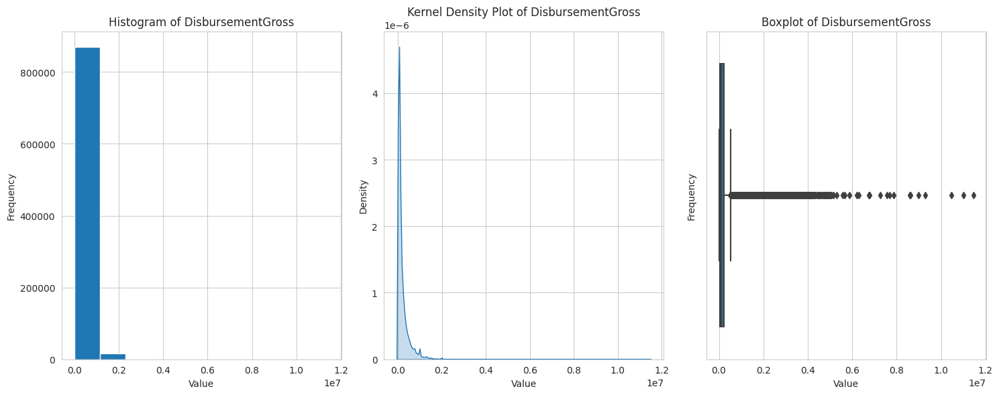

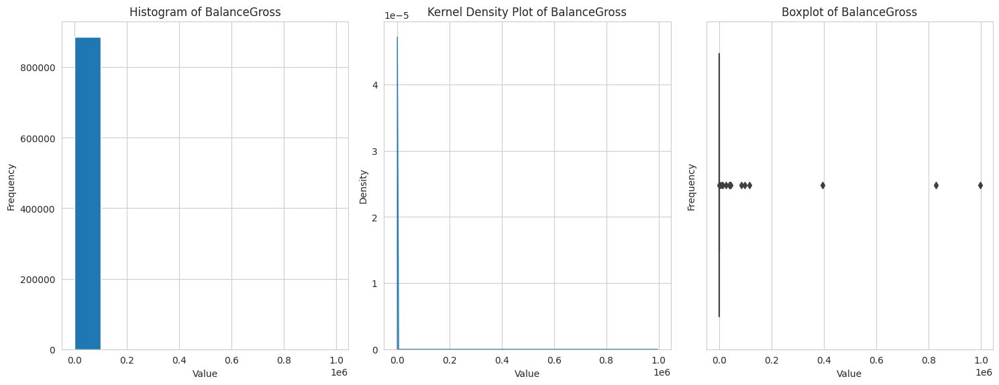

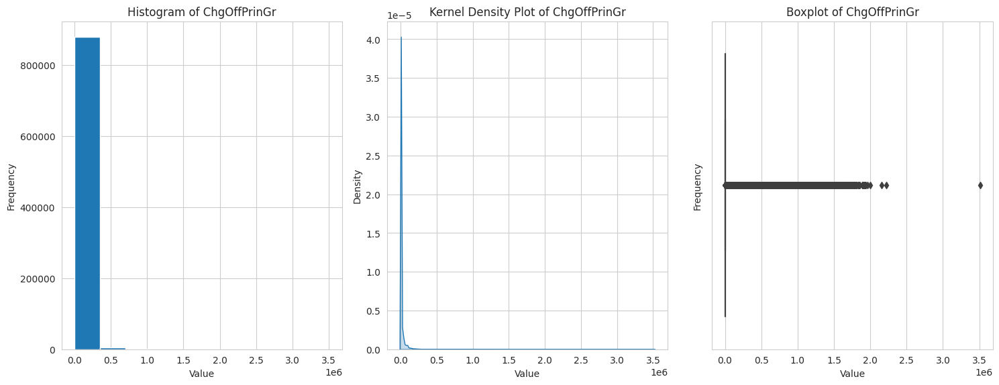

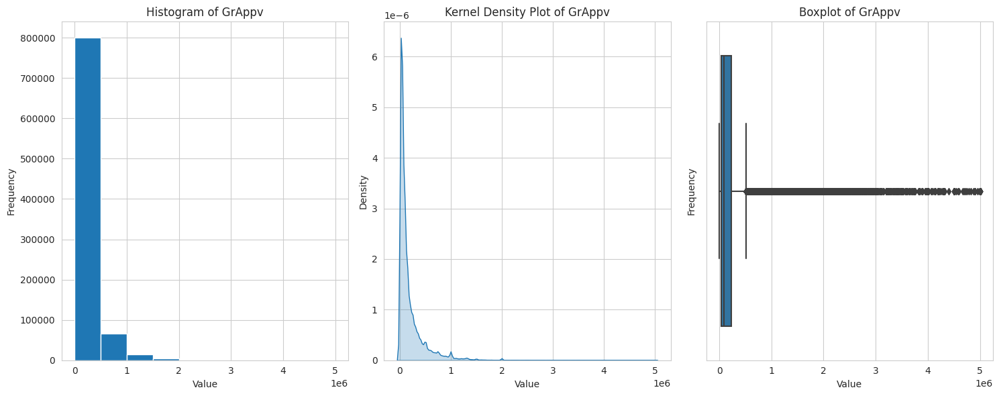

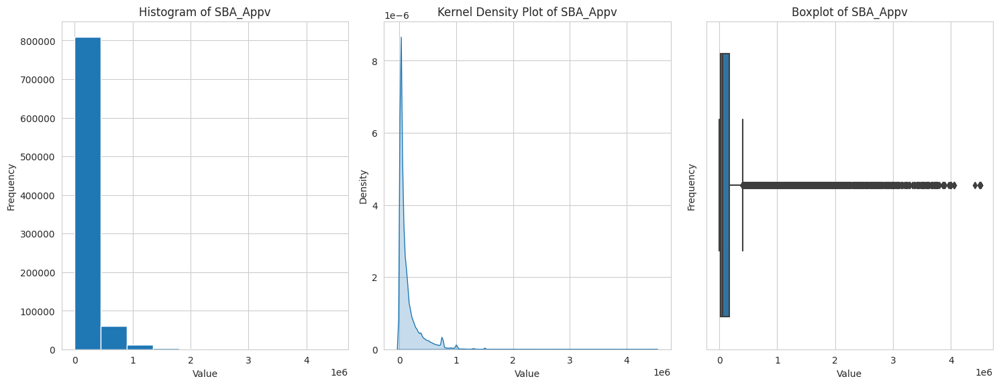

In [31]:
df_num = df[['DisbursementGross', 'BalanceGross', 'ChgOffPrinGr', 'GrAppv', 'SBA_Appv']]

# Assuming your DataFrame is named 'df'
for col in df_num.columns:
    # Create a figure with three subplots
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    # Histogram
    ax[0].hist(df_num[col], bins=10)
    ax[0].set_xlabel('Value')
    ax[0].set_ylabel('Frequency')
    ax[0].set_title('Histogram of {}'.format(col))

    # Kernel Density Plot
    sns.kdeplot(df_num[col], ax=ax[1], fill = True)
    ax[1].set_xlabel('Value')
    ax[1].set_ylabel('Density')
    ax[1].set_title('Kernel Density Plot of {}'.format(col))

    # Boxplot
    sns.boxplot(x = df_num[col], ax=ax[2])
    ax[2].set_xlabel('Value')
    ax[2].set_ylabel('Frequency')
    ax[2].set_title('Boxplot of {}'.format(col))

    # Show the plots
    plt.tight_layout()
    plt.show()

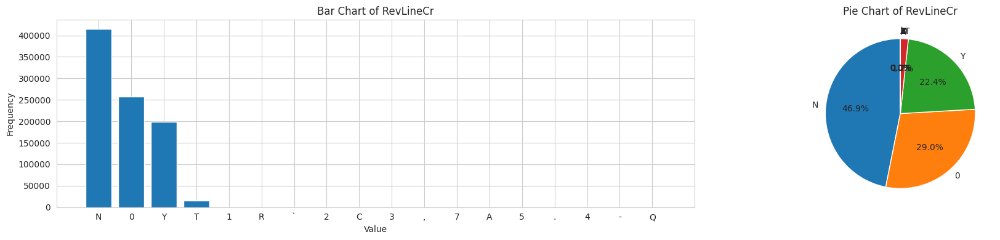

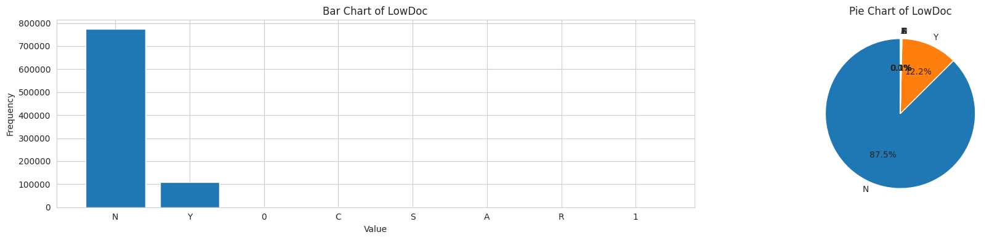

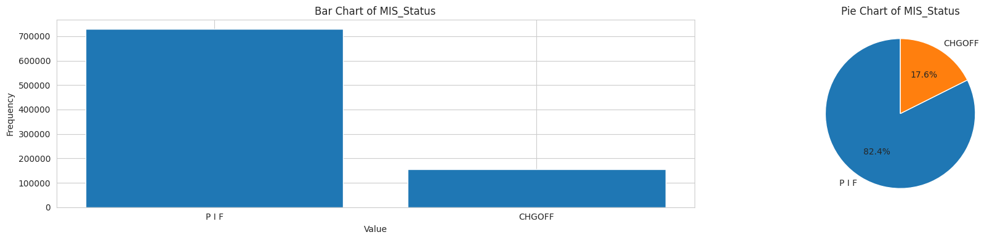

In [32]:
df_obj = df[['RevLineCr',	'LowDoc', 'MIS_Status']]

# Assuming your DataFrame is named 'df'
for col in df_obj.columns:
    # Create a figure with two subplots
    fig, ax = plt.subplots(1, 2, figsize=(20, 4))

    # Bar Chart
    counts = df_obj[col].value_counts()
    ax[0].bar(counts.index, counts.values)
    ax[0].set_xlabel('Value')
    ax[0].set_ylabel('Frequency')
    ax[0].set_title('Bar Chart of {}'.format(col))

    # Pie Chart
    proportions = df_obj[col].value_counts(normalize=True)
    ax[1].pie(proportions.values, labels=proportions.index, autopct='%1.1f%%', startangle=90)
    ax[1].set_title('Pie Chart of {}'.format(col))

    # Show the plots
    plt.tight_layout()
    plt.show()

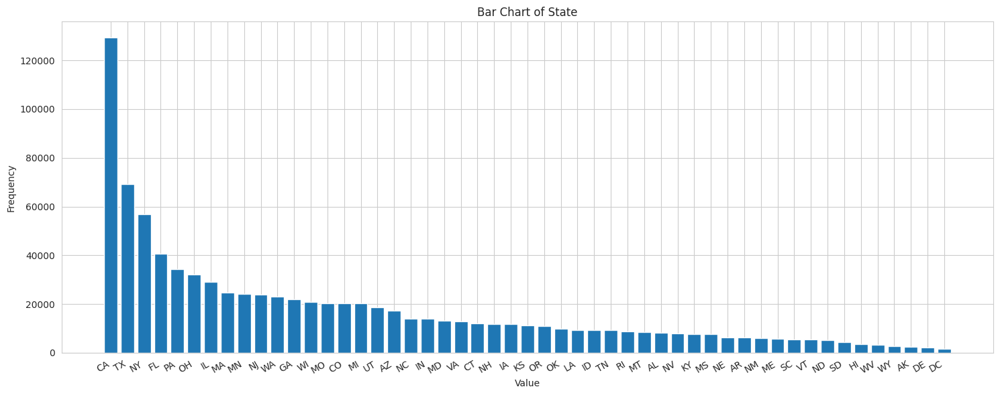

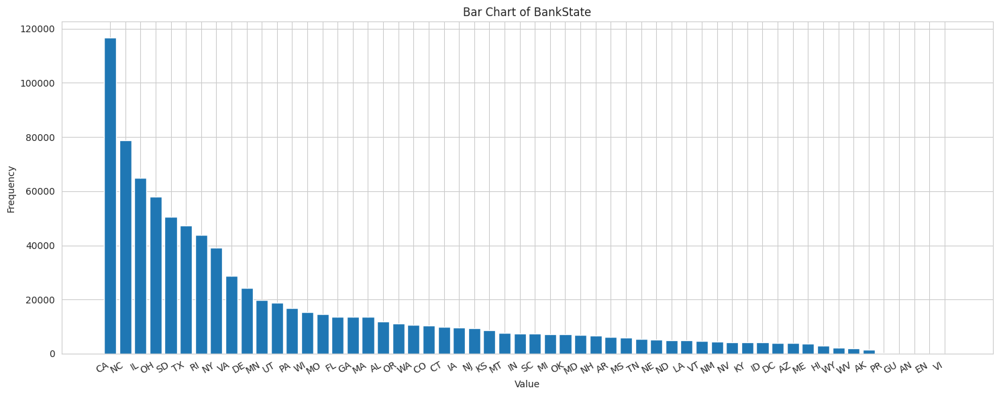

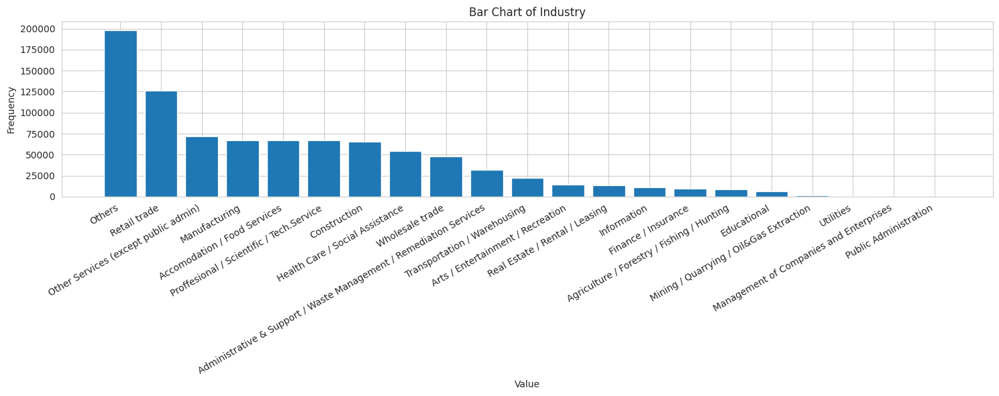

In [33]:
df_obj = df[['State',	'BankState', 'Industry']]

# Assuming your DataFrame is named 'df'
for col in df_obj.columns:
    # Create a figure with onlyone plots
    fig, ax = plt.subplots(1, 1, figsize=(15, 6))

    # Bar Chart
    counts = df_obj[col].value_counts()
    ax.bar(counts.index, counts.values)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.set_title('Bar Chart of {}'.format(col))

    # Show the plots
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()


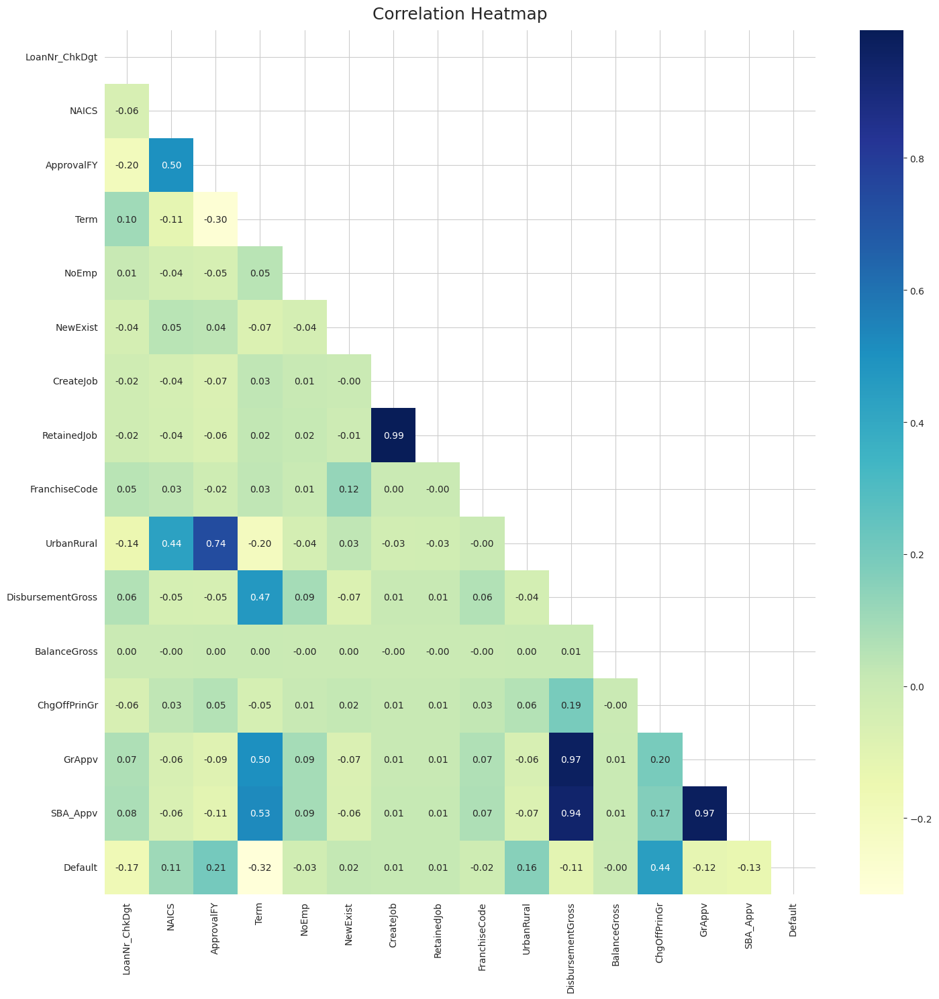

In [34]:
plt.figure(figsize=(15, 15))

p = df.corr(numeric_only=True)

mask = np.triu(np.ones_like(p, dtype=bool))
heatmap = sns.heatmap(p, cmap='YlGnBu', mask=mask, annot=True, fmt='.2f')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)

plt.tight_layout()
plt.show()

**Positive correlation**:
There is a positive correlation between GrApprv, SBA_Appv, and DisbursementGross, which means that the number of loans submitted is close to the amount of loans disbursed. What needs to be done from these results is to re-check, so that only one variable can be selected in the modeling because the variants of the three variables are mutually represented.

There is a strong correlation between RetainedJob and CreatedJob which indicates workers can keep their jobs.

**Negative Correlation**:
There is a negative correlation between Term and Default, meaning we have to assume that the majority of borrowers with longer repayment terms are unable to make payments.

## Feature Selection ANOVA

In [35]:
# split dataset into features (X) and target (y)
X = df[['ApprovalFY', 'Term', 'NoEmp', 'NewExist', 'FranchiseCode', 'CreateJob', 'RetainedJob', 'UrbanRural', 'DisbursementGross', 'BalanceGross', 'ChgOffPrinGr', 'GrAppv', 'SBA_Appv']]
y = df['Default']

# perform ANOVA feature selection
f_scores, p_values = f_classif(X, y)

# create a dataframe to store feature names, f-scores, and p-values
anova_results = pd.DataFrame({'Features': X.columns, 'F-Scores': f_scores, 'P-Values': p_values})

# sort the dataframe by descending f-scores
anova_results = anova_results.sort_values(by='F-Scores', ascending=False, ignore_index=True)

# print the feature scores
anova_results

,Features,F-Scores,P-Values
0,ChgOffPrinGr,218315.204513,0.000000e+00
1,Term,98173.604897,0.000000e+00
2,ApprovalFY,38984.992314,0.000000e+00
3,UrbanRural,22635.897079,0.000000e+00
4,SBA_Appv,15909.722524,0.000000e+00
5,GrAppv,13114.301143,0.000000e+00
6,DisbursementGross,11067.273385,0.000000e+00
7,NoEmp,607.215086,5.009275e-134
8,NewExist,343.070506,1.414741e-76
9,FranchiseCode,208.308198,3.253434e-47


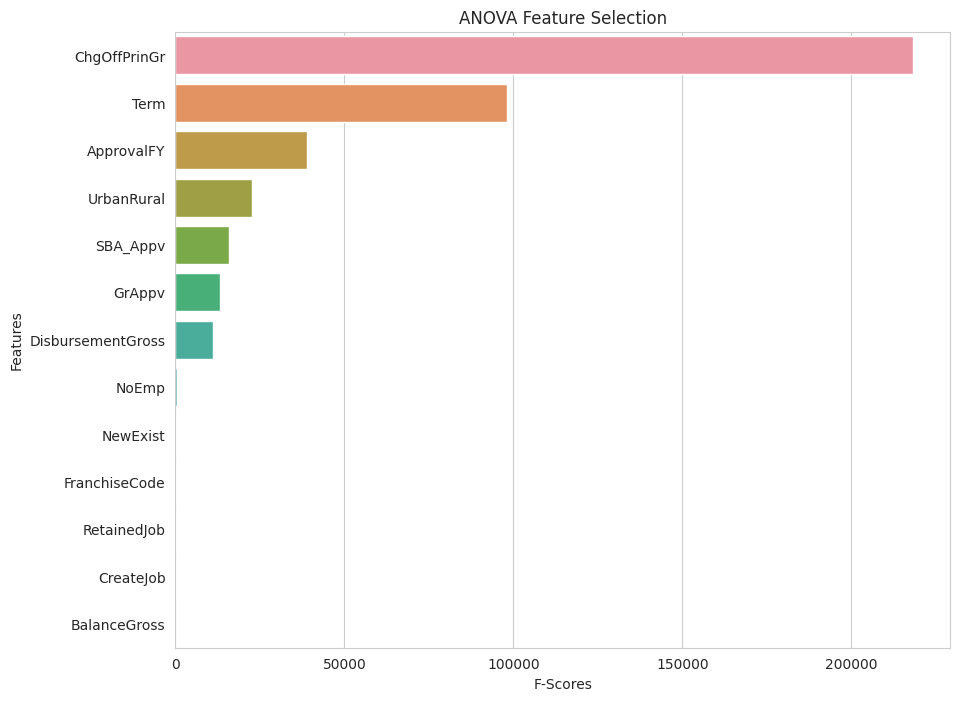

In [36]:
# create horizontal bar plot for f-scores
plt.figure(figsize=(10, 8))
sns.barplot(x='F-Scores', y='Features', data=anova_results, orient='h')
plt.title('ANOVA Feature Selection')
plt.xlabel('F-Scores')
plt.ylabel('Features')
plt.show()

In [37]:
# create a SelectKBest object
selector = SelectKBest(f_classif, k=5)

# fit selector to data
selector.fit(X, y)

# get selected features
selected_features = X.columns[selector.get_support()]

# display selected features
print('Selected features:', list(selected_features))

Selected features: ['ApprovalFY', 'Term', 'UrbanRural', 'ChgOffPrinGr', 'SBA_Appv']


## Feature Selection using Chi2

In [38]:
# split dataset into features (X) and target (y)
X = df[['RevLineCr',	'LowDoc', 'Industry']]
y = df['MIS_Status']

# convert categorical features to numeric using one-hot encoding
X = pd.get_dummies(X, columns=X.columns)

# perform Chi2 feature selection
chi2_scores, p_values = chi2(X, y)

# create a dataframe to store feature names, chi2_scores, and p-values
chi2_results = pd.DataFrame({'Features': X.columns, 'chi2_scores': chi2_scores, 'P-Values': p_values})

# sort the dataframe by descending chi2_scores
chi2_results = chi2_results.sort_values(by='chi2_scores', ascending=False)

# print the feature scores
chi2_results = chi2_results.reset_index(drop=True)

# Only RevLineCr_Y, LowDoc_Y, RevLineCr_Y, LowDoc_N
# chi2_results = chi2_results.drop(chi2_results.index[32:])
# chi2_results = chi2_results.drop([0, 4, 14, 19, 22, 23, 28, 30]).reset_index(drop=True)
chi2_results

,Features,chi2_scores,P-Values
0,Industry_Others,11765.777658,0.000000e+00
1,RevLineCr_Y,8710.089193,0.000000e+00
2,RevLineCr_T,6870.654353,0.000000e+00
3,LowDoc_Y,5339.571617,0.000000e+00
4,RevLineCr_N,2745.656361,0.000000e+00
5,Industry_Retail trade,2327.196515,0.000000e+00
6,Industry_Health Care / Social Assistance,1955.958355,0.000000e+00
7,Industry_Construction,1488.411699,0.000000e+00
8,RevLineCr_0,1251.685285,3.571413e-274
9,Industry_Transportation / Warehousing,1206.952433,1.880811e-264


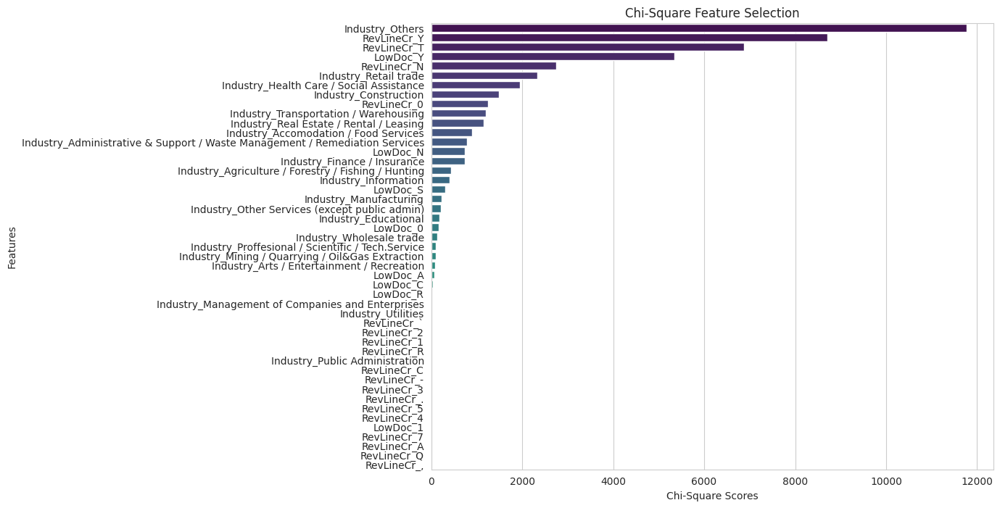

In [39]:
# create horizontal bar plot for chi-square scores
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='chi2_scores', y='Features', data=chi2_results, palette='viridis')

# set title and labels
ax.set_title('Chi-Square Feature Selection')
ax.set_xlabel('Chi-Square Scores')
ax.set_ylabel('Features')

# show the plot
plt.show()

In [40]:
# create a SelectKBest object
selector = SelectKBest(chi2, k=5)

# fit selector to data
selector.fit(X, y)

# get selected features
selected_features = X.columns[selector.get_support()]

# display selected features
print('Selected features:', list(selected_features))

Selected features: ['RevLineCr_N', 'RevLineCr_T', 'RevLineCr_Y', 'LowDoc_Y', 'Industry_Others']


## Plot Insight

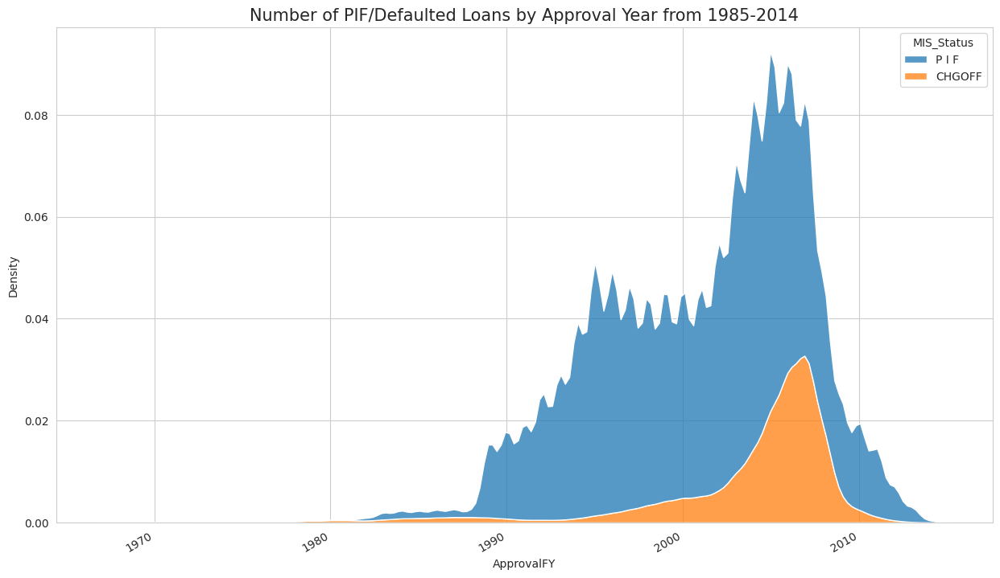

In [41]:
fig, ax = plt.subplots(1, 1, figsize = (15,8))
sns.kdeplot(x = df.ApprovalFY, hue=df.MIS_Status, multiple="stack", ax=ax)
ax.set_title('Number of PIF/Defaulted Loans by Approval Year from 1985-2014', fontsize=15)
plt.xticks(rotation = 30, fontsize = 10, horizontalalignment='right')
# plt.xlim(1985,2014)
plt.show()

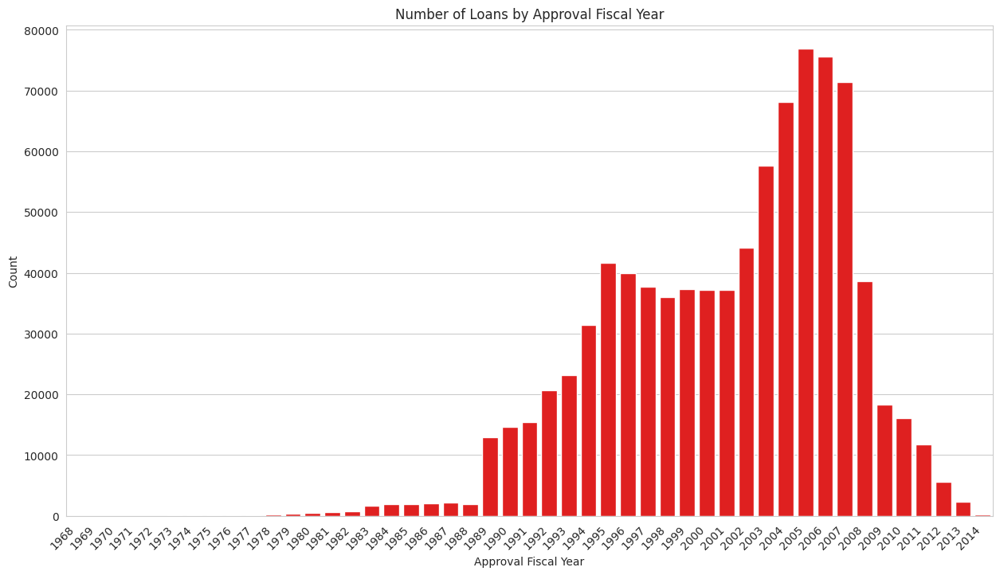

In [42]:
p = df['ApprovalFY'].value_counts().reset_index().sort_values('index').reset_index(drop=True)
p.columns = ['ApprovalFYear', 'count']

# create figure and axis objects
fig, ax = plt.subplots(1, 1, figsize=(15, 8))

# create barplot
sns.barplot(x='ApprovalFYear', y='count', data=p, ax=ax, color='red')

# set axis labels and title
ax.set_xlabel('Approval Fiscal Year')
ax.set_ylabel('Count')
ax.set_title('Number of Loans by Approval Fiscal Year')
plt.xticks(rotation = 45, fontsize = 10, ha='right')

# show plot
plt.show()

1. The number of customers who are able to repay loans (PIF) is greater than those who are unable to repay loans (CHGOFF).
2. The increase in the number of loans began in 1998, and the highest frequency was in the range of 2003-2007.
3. In 1998, the era of industrial transformation 3.0 began, so that many loans were disbursed, but in 2007 there was an economic recession in the US resulting in a decline and a peak in payment defaults due to the recession.
4. Loans at banks throughout the United States from SBA data started from 1984 to 2014, but data > 2010 will be deleted because the data was dominated by unfinished loans (data with DisbursementFY > 2010 and Term > 48) as much as 80% where loans were not can be decided in default or not.

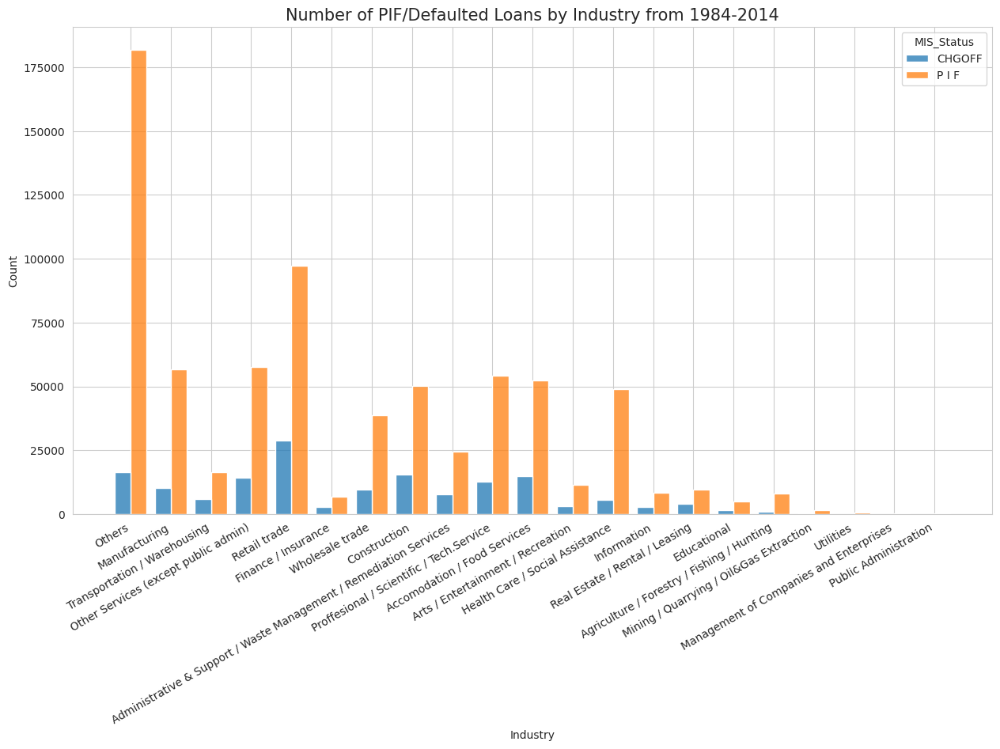

In [43]:
df_a = df.sort_values('MIS_Status', ascending = True)

fig, ax = plt.subplots(1, 1, figsize = (15,8))
sns.histplot(data=df_a, x="Industry", hue="MIS_Status", multiple="dodge", shrink=.8, ax=ax)
ax.set_title('Number of PIF/Defaulted Loans by Industry from 1984-2014', fontsize=15)
plt.xticks(rotation = 30, fontsize = 10, ha='right')
plt.show()

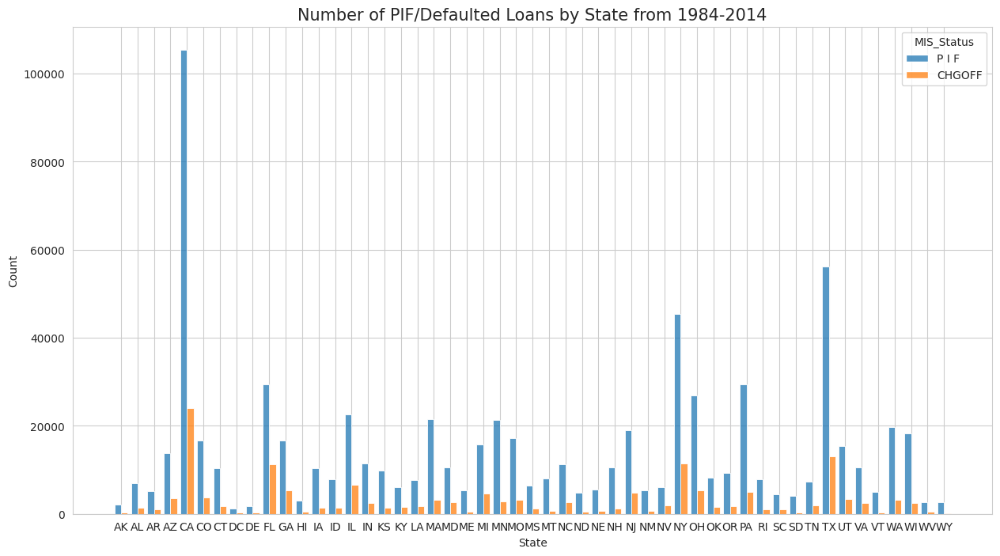

In [44]:
df_a = df.sort_values('State', ascending = True)

fig, ax = plt.subplots(1, 1, figsize = (15,8))
sns.histplot(data=df_a, x="State", hue="MIS_Status", multiple="dodge", shrink=.8, ax=ax)
ax.set_title('Number of PIF/Defaulted Loans by State from 1984-2014', fontsize=15)
# plt.xticks(fontsize = 10, ha='right')
plt.show()

In [45]:
def_state = df.groupby(['State', 'Default'])['State'].count().unstack('Default')
def_state['Def_Percent'] = def_state[1]/(def_state[1] + def_state[0])*100
def_state['count'] = def_state[1] + def_state[0]

def_state.sort_values('Def_Percent', ascending=False, inplace=True)
def_state.reset_index(inplace=True)
def_state.columns = ['State', 'PIF', 'CHGOFF','Percent', 'Count']
def_state

,State,PIF,CHGOFF,Percent,Count
0,FL,29477,11196,27.526861,40673
1,GA,16723,5275,23.979453,21998
2,DC,1217,382,23.889931,1599
3,NV,6081,1844,23.268139,7925
4,IL,22511,6638,22.772651,29149
5,MI,15692,4589,22.627089,20281
6,TN,7281,1956,21.175706,9237
7,AZ,13815,3616,20.744650,17431
8,SC,4390,1114,20.239826,5504
9,NJ,19011,4806,20.178864,23817


In [46]:
def_ind = df.groupby(['Industry', 'Default'])['Industry'].count().unstack('Default')
def_ind['Def_Percent'] = def_ind[1]/(def_ind[1] + def_ind[0])*100
def_ind['count'] = def_ind[1] + def_ind[0]

def_ind.sort_values('Def_Percent', ascending=False, inplace=True)
def_ind.reset_index(inplace=True)
def_ind.columns = ['Industry', 'PIF', 'CHGOFF','Percent','Count']
def_ind

,Industry,PIF,CHGOFF,Percent,Count
0,Real Estate / Rental / Leasing,9584,3873,28.780560,13457
1,Finance / Insurance,6724,2654,28.300277,9378
2,Transportation / Warehousing,16269,5866,26.501016,22135
3,Information,8430,2790,24.866310,11220
4,Educational,4793,1520,24.077301,6313
5,Administrative & Support / Waste Management / ...,24544,7570,23.572274,32114
6,Construction,50314,15321,23.342729,65635
7,Retail trade,97103,28659,22.788283,125762
8,Accomodation / Food Services,52306,14778,22.029098,67084
9,Arts / Entertainment / Recreation,11472,2988,20.663900,14460


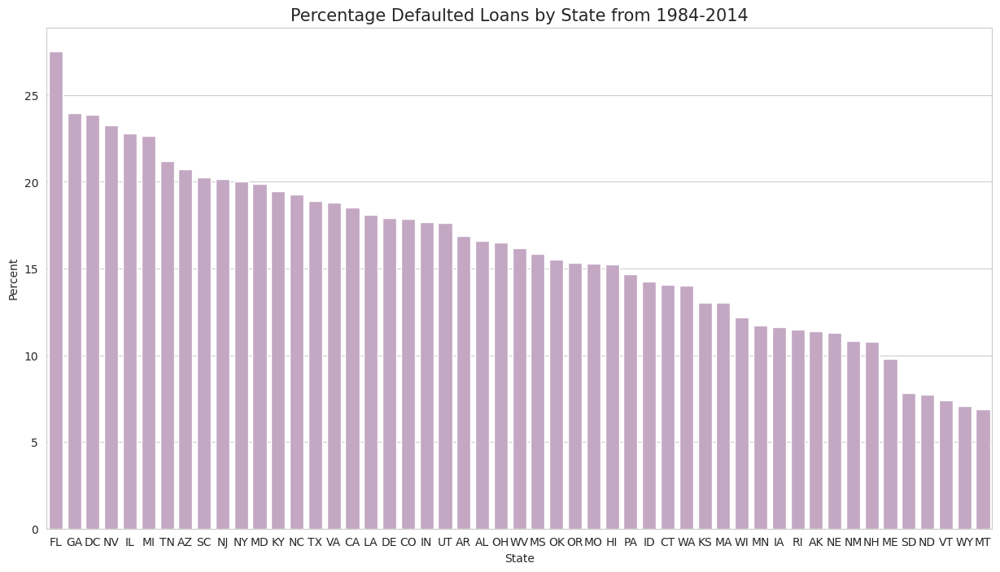

In [47]:
fig, ax = plt.subplots(1, 1, figsize = (15,8))
sns.barplot(data=def_state, x="State", y="Percent", width=0.75, color='#C8A2C8', ax=ax)
ax.set_title('Percentage Defaulted Loans by State from 1984-2014', fontsize=15)
# plt.xticks(rotation = 30, fontsize = 10, ha='right')
plt.show()

The state that has the highest percentage of defaulted loans is Florida up to 30%, but the largest number of customers is in California with up to 100.000 users

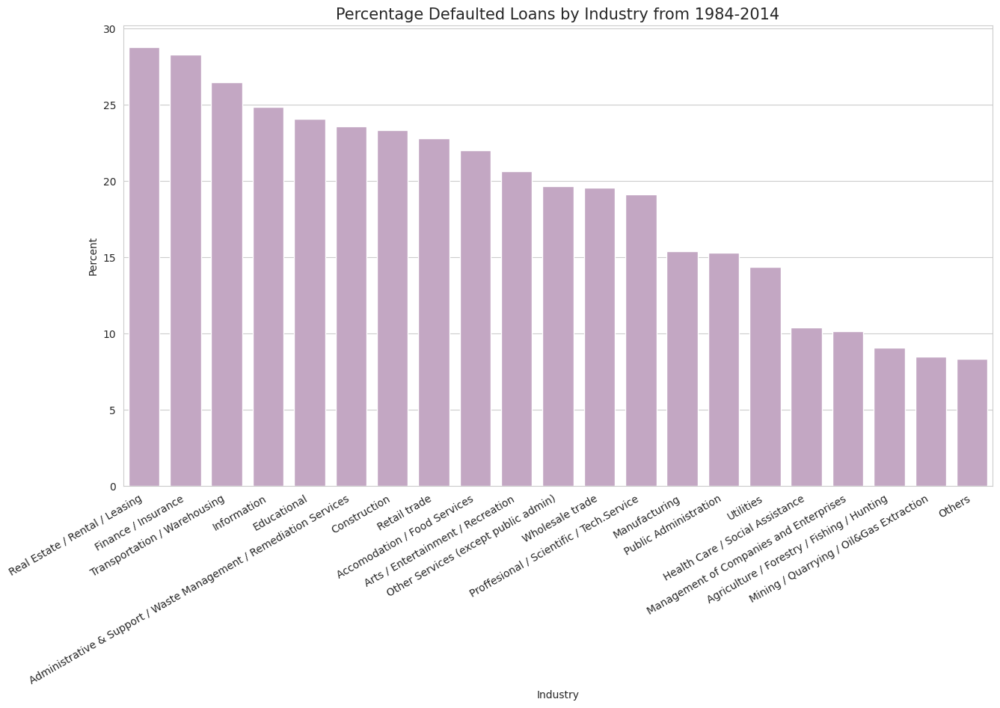

In [48]:
fig, ax = plt.subplots(1, 1, figsize = (15,8))
sns.barplot(data=def_ind, x="Industry", y="Percent", width=0.75, color='#C8A2C8', ax=ax)
ax.set_title('Percentage Defaulted Loans by Industry from 1984-2014', fontsize=15)
plt.xticks(rotation = 30, fontsize = 10, ha='right')
plt.show()

The industrial sector that has the highest bad credit is Real Estate/Rental/Leasing and Finance/Insurance up to 28%. This is because the industrial sector has a high risk. In this data there was a big recession in America from 2007 to 2009 so that it will reduce the amount Paid in Full.

In [49]:
ins1_group = df.groupby(['Industry', 'MIS_Status'])['LoanNr_ChkDgt'].count().reset_index()
ins1_pivot = ins1_group.pivot_table(index='Industry', columns='MIS_Status').reset_index()
ins1_pivot.columns = ['Industry', 'CHGOFF', 'PIF']

ins1_pivot = ins1_pivot.sort_values('CHGOFF', ascending = True).reset_index(drop = True)
ins1_pivot

,Industry,CHGOFF,PIF
0,Management of Companies and Enterprises,26,230
1,Public Administration,34,188
2,Utilities,94,560
3,Mining / Quarrying / Oil&Gas Extraction,154,1666
4,Agriculture / Forestry / Fishing / Hunting,806,8062
5,Educational,1520,4793
6,Finance / Insurance,2654,6724
7,Information,2790,8430
8,Arts / Entertainment / Recreation,2988,11472
9,Real Estate / Rental / Leasing,3873,9584


In [50]:
df_ins1 = (df.groupby('Industry')['MIS_Status']
           .value_counts(normalize=True) #proporsi
           .mul(100) #x100
           .round(2) #pembulatan 2 angka
           .unstack()) #pemisah
df_ins1 = df_ins1.reset_index()
df_ins1.columns = ['Industry', 'CHGOFF', 'PIF']

df_ins1 = df_ins1.sort_values('CHGOFF', ascending = True).reset_index(drop = True)
df_ins1

,Industry,CHGOFF,PIF
0,Others,8.33,91.67
1,Mining / Quarrying / Oil&Gas Extraction,8.46,91.54
2,Agriculture / Forestry / Fishing / Hunting,9.09,90.91
3,Management of Companies and Enterprises,10.16,89.84
4,Health Care / Social Assistance,10.40,89.60
5,Utilities,14.37,85.63
6,Public Administration,15.32,84.68
7,Manufacturing,15.41,84.59
8,Proffesional / Scientific / Tech.Service,19.13,80.87
9,Wholesale trade,19.59,80.41


Text(0.5, 0.98, 'MIS Status by Industry 1984 - 2014')

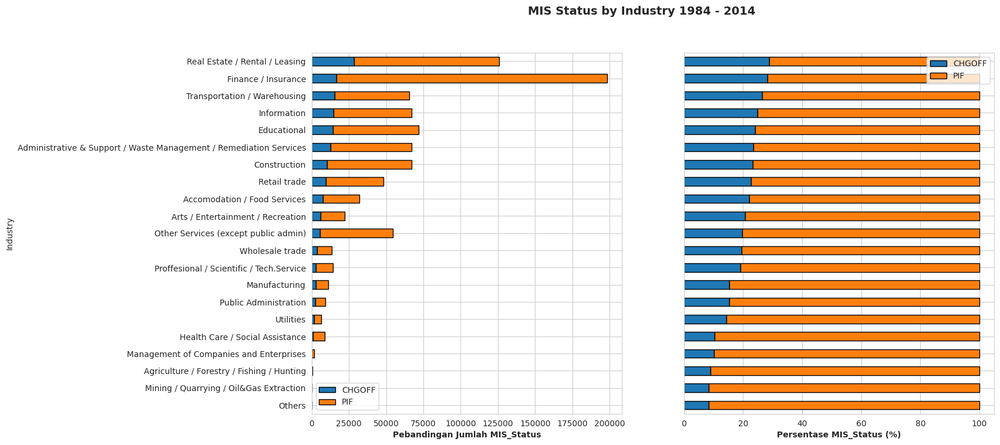

In [51]:
fig, ax = plt.subplots(1, 2, figsize = (15,8), sharey = True)

ins1_pivot.plot(x = 'Industry', kind='barh', stacked=True, edgecolor= 'black', ax = ax[0])
# ax[1].title('Perbandingan Jumlah', fontweight='bold', fontsize=17, pad=14)
ax[0].set_xlabel('Pebandingan Jumlah MIS_Status', fontweight='bold')
# ax[0].set_ylabel('Industry', fontweight='bold')
# ax[1].legend(labels=['CHGOFF', 'P I F'], bbox_to_anchor = [1.25,0.9])

df_ins1.plot(x = 'Industry', kind='barh', stacked=True, edgecolor='black', ax = ax[1])
# ax[0].title('Perbandingan Persentase', fontweight='bold', fontsize=17, pad=14)
ax[1].set_xlabel('Persentase MIS_Status (%)', fontweight='bold')
# ax[1].set_ylabel('Industry', fontweight='bold')
# ax[0].legend(bbox_to_anchor = [1.25*1.5,0.9])

fig.suptitle("MIS Status by Industry 1984 - 2014", fontsize=14, weight = 'bold')

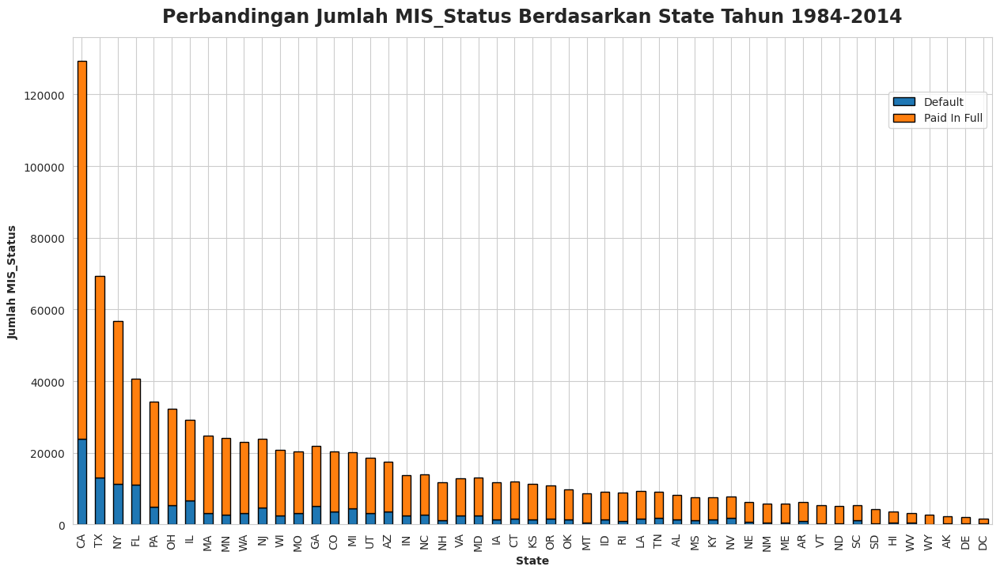

In [52]:
ins_t1 = pd.pivot_table(df,
                         index=['State'],
                         columns=['MIS_Status'],
                         values=['LoanNr_ChkDgt'],
                         aggfunc={'LoanNr_ChkDgt' : ['nunique']})

ins_t1 = ins_t1.reset_index()
ins_t1.columns = ['State', 'CHGOFF', 'PIF']

ins_t1 = ins_t1.sort_values('PIF', ascending = False, ignore_index = True)

fig, ax= plt.subplots(1,1,figsize=(15,8))
ins_t1.plot(x = 'State', kind='bar', stacked=True, edgecolor= 'black', ax=ax)
plt.title('Perbandingan Jumlah MIS_Status Berdasarkan State Tahun 1984-2014', fontweight='bold', fontsize=17, pad=14)
plt.xlabel('State', fontweight='bold')
plt.ylabel('Jumlah MIS_Status', fontweight='bold')
plt.legend(labels=['Default', 'Paid In Full'], bbox_to_anchor = [1,0.9])

In [53]:
df_a = df[(df['ApprovalFY'] >= 2007) & (df['ApprovalFY'] <= 2009)]

ins1_group = df_a.groupby(['Industry', 'MIS_Status'])['LoanNr_ChkDgt'].count().reset_index()
ins1_pivot = ins1_group.pivot_table(index='Industry', columns='MIS_Status').reset_index()
ins1_pivot.columns = ['Industry', 'CHGOFF', 'PIF']

ins1_pivot = ins1_pivot.sort_values('CHGOFF', ascending = True).reset_index(drop = True)
ins1_pivot

,Industry,CHGOFF,PIF
0,Management of Companies and Enterprises,11.0,17.0
1,Public Administration,14.0,20.0
2,Utilities,44.0,65.0
3,Mining / Quarrying / Oil&Gas Extraction,61.0,248.0
4,Agriculture / Forestry / Fishing / Hunting,149.0,735.0
5,Educational,667.0,963.0
6,Information,967.0,1296.0
7,Arts / Entertainment / Recreation,1061.0,1626.0
8,Finance / Insurance,1143.0,1273.0
9,Real Estate / Rental / Leasing,1801.0,1854.0


In [54]:
df_ins1 = (df_a.groupby('Industry')['MIS_Status']
           .value_counts(normalize=True) #proporsi
           .mul(100) #x100
           .round(2) #pembulatan 2 angka
           .unstack()) #pemisah
df_ins1 = df_ins1.reset_index()
df_ins1.columns = ['Industry', 'CHGOFF', 'PIF']

df_ins1 = df_ins1.sort_values('CHGOFF', ascending = True).reset_index(drop = True)
df_ins1

,Industry,CHGOFF,PIF
0,Agriculture / Forestry / Fishing / Hunting,16.86,83.14
1,Mining / Quarrying / Oil&Gas Extraction,19.74,80.26
2,Health Care / Social Assistance,22.08,77.92
3,Manufacturing,32.17,67.83
4,Accomodation / Food Services,37.12,62.88
5,Proffesional / Scientific / Tech.Service,38.27,61.73
6,Management of Companies and Enterprises,39.29,60.71
7,Arts / Entertainment / Recreation,39.49,60.51
8,Utilities,40.37,59.63
9,Other Services (except public admin),40.77,59.23


Text(0.5, 0.98, 'MIS Status by Industry in Great Recession 2007 - 2009')

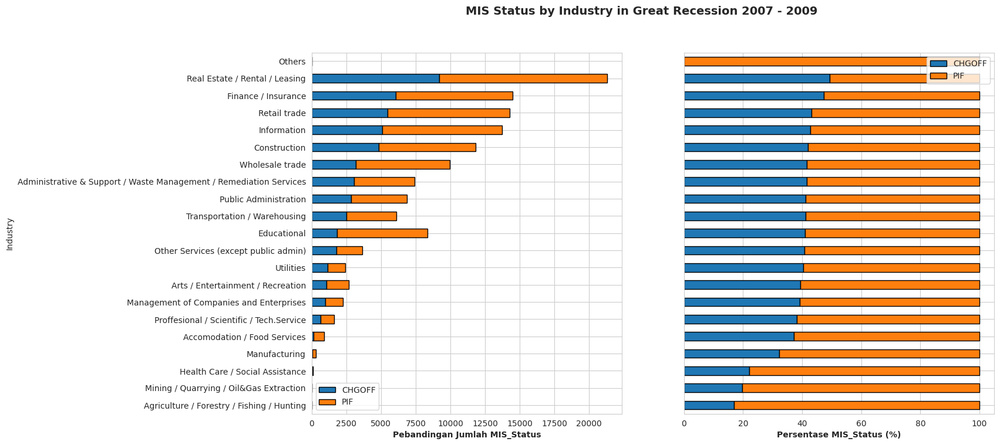

In [55]:
fig, ax = plt.subplots(1, 2, figsize = (15,8), sharey = True)

ins1_pivot.plot(x = 'Industry', kind='barh', stacked=True, edgecolor= 'black', ax = ax[0])
# ax[1].title('Perbandingan Jumlah', fontweight='bold', fontsize=17, pad=14)
ax[0].set_xlabel('Pebandingan Jumlah MIS_Status', fontweight='bold')
# ax[0].set_ylabel('Industry', fontweight='bold')
# ax[1].legend(labels=['CHGOFF', 'P I F'], bbox_to_anchor = [1.25,0.9])

df_ins1.plot(x = 'Industry', kind='barh', stacked=True, edgecolor='black', ax = ax[1])
# ax[0].title('Perbandingan Persentase', fontweight='bold', fontsize=17, pad=14)
ax[1].set_xlabel('Persentase MIS_Status (%)', fontweight='bold')
# ax[1].set_ylabel('Industry', fontweight='bold')
# ax[0].legend(bbox_to_anchor = [1.25*1.5,0.9])

fig.suptitle("MIS Status by Industry in Great Recession 2007 - 2009", fontsize=14, weight = 'bold')

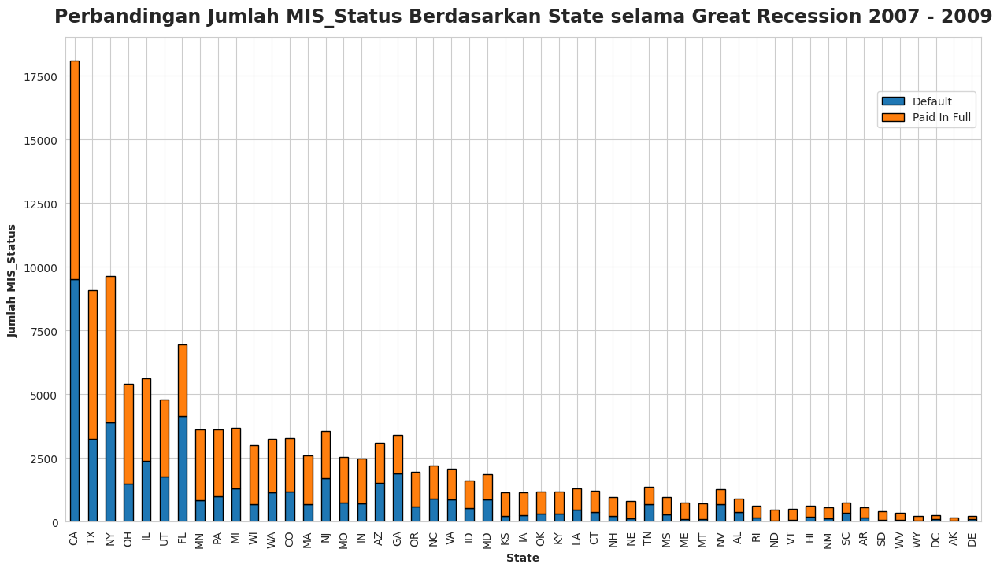

In [56]:
ins_t2 = pd.pivot_table(df_a,
                         index=['State'],
                         columns=['MIS_Status'],
                         values=['LoanNr_ChkDgt'],
                         aggfunc={'LoanNr_ChkDgt' : ['nunique']})

ins_t2 = ins_t2.reset_index()
ins_t2.columns = ['State', 'CHGOFF', 'PIF']

ins_t2 = ins_t2.sort_values('PIF', ascending = False, ignore_index = True)

fig, ax= plt.subplots(1,1,figsize=(15,8))
ins_t2.plot(x = 'State', kind='bar', stacked=True, edgecolor= 'black', ax=ax)
plt.title('Perbandingan Jumlah MIS_Status Berdasarkan State selama Great Recession 2007 - 2009', fontweight='bold', fontsize=17, pad=14)
plt.xlabel('State', fontweight='bold')
plt.ylabel('Jumlah MIS_Status', fontweight='bold')
plt.legend(labels=['Default', 'Paid In Full'], bbox_to_anchor = [1,0.9])

Text(83.34722222222221, 0.5, 'Number of Default Loans')

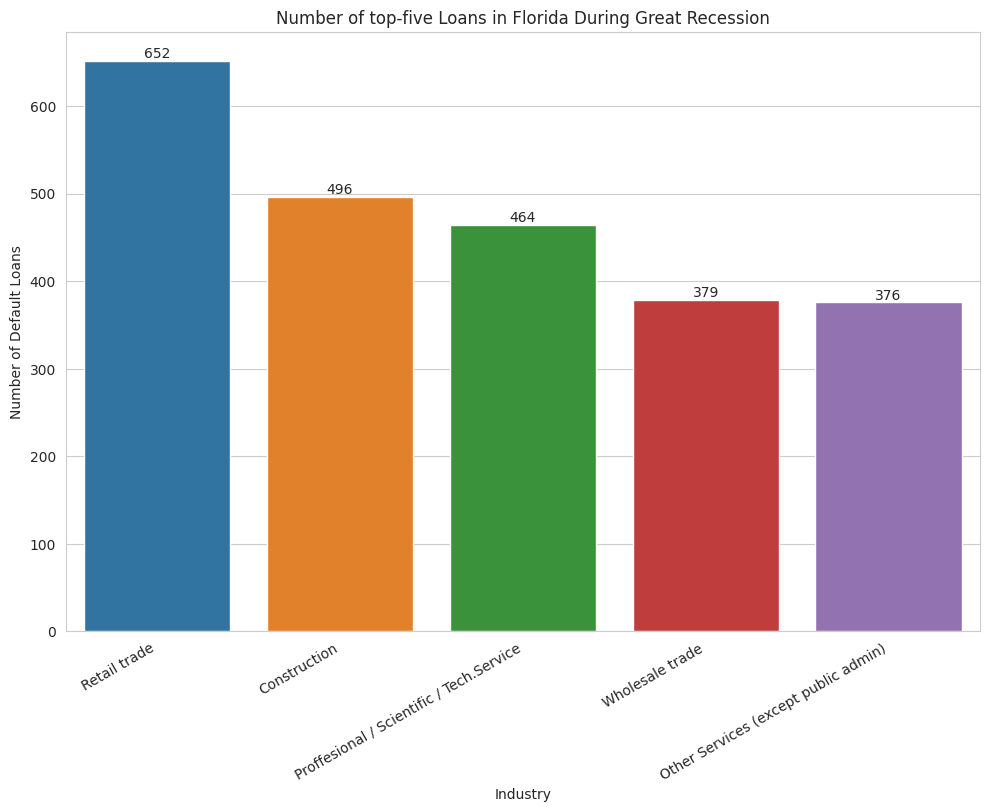

In [57]:
dflorida = df[ (df['State'].isin(['FL'])) 
                    & (  (df['ApprovalFY']>= 2007) & (df['ApprovalFY'] <= 2009) ) & (df['Default'] == 1)]
dfl_groupby = dflorida.groupby('Industry')['LoanNr_ChkDgt'].nunique().reset_index(name = 'NumberofDefaultLoans').sort_values(['NumberofDefaultLoans'], ascending = False).head()
dfl_groupby

fig, ax= plt.subplots(1,1,figsize=(10,8))

sns.barplot(data=dfl_groupby, x="Industry", y="NumberofDefaultLoans")
ax.set_xticklabels(dfl_groupby.reset_index(drop=True).Industry, rotation=30, ha='right', fontsize=10)

for i in ax.containers:
    ax.bar_label(i)
plt.tight_layout() 


plt.title('Number of top-five Loans in Florida During Great Recession')
plt.ylabel('Number of Default Loans')

During the Great Recession in Florida (the state with the most defaults), bad loans were dominated by: Retail Trade (512 loans), Construction (423 loans), Prof/Science/Tech (398 loans), Wholesale Trade (319 loans) . ), and another pub no (299 loans). It can be concluded that this type of industry was most affected by the Great Florida Recession.

Suggestion: Banks that provide loans in Florida must be more selective in providing loans in this sector because it is less stable in Florida

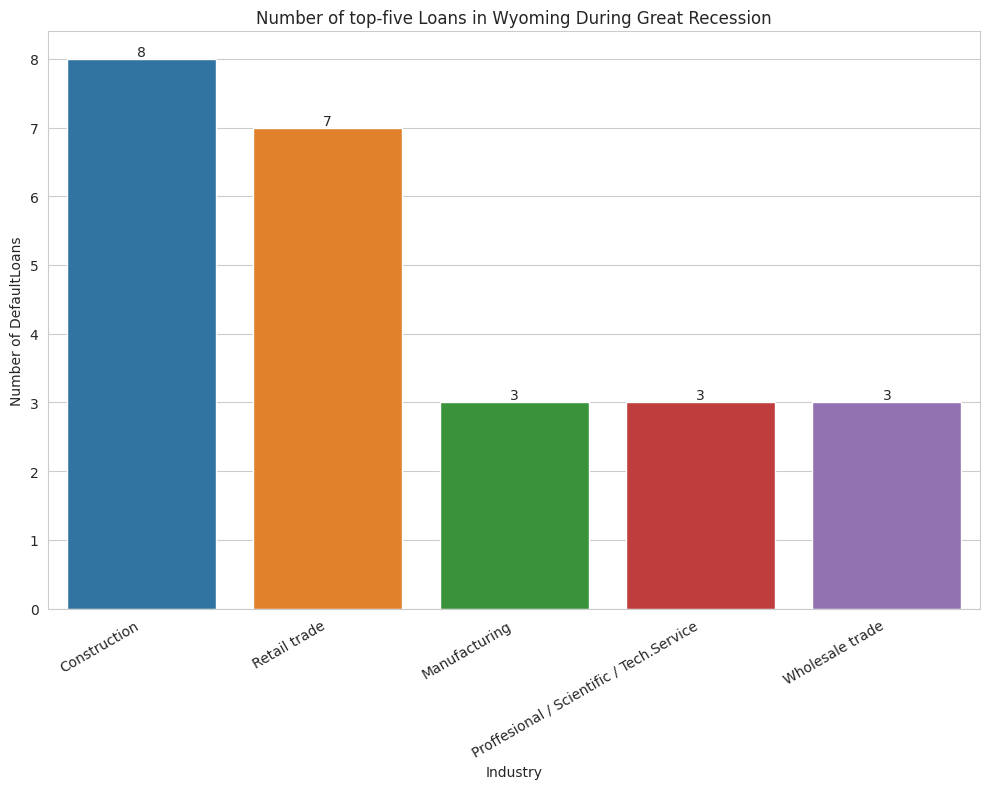

In [58]:
dwyoming = df[ (df['State'].isin(['WY'])) 
                    & (  (df['ApprovalFY']>= 2007) & (df['ApprovalFY'] <= 2009) ) & (df['Default'] == 1)]
dwy_groupby = dwyoming.groupby('Industry')['LoanNr_ChkDgt'].nunique().reset_index(name = 'NumberofLoans').sort_values(['NumberofLoans'], ascending = False).head()

fig,ax= plt.subplots(1,1,figsize=(10,8))

sns.barplot(data=dwy_groupby, x="Industry", y="NumberofLoans")
ax.set_xticklabels(dwy_groupby.reset_index(drop=True).Industry, rotation=30, ha='right', fontsize=10)

for i in ax.containers:
    ax.bar_label(i)

plt.tight_layout()
plt.title('Number of top-five Loans in Wyoming During Great Recession')
plt.ylabel('Number of DefaultLoans')
plt.tight_layout()

During the Great Recession in Wyoming (State with fewest defaults), default loans were dominated by: Contraction (8 loans), Retail Trade (7 loans), Wholesale Trade (3 loans), Manufacturing (2 loans), and no pubs others ( 2 loans). It can be concluded that Wyoming was the state with very few defaults during the Great Recession, even as the sector with the most defaults did not touch 10 loans. This area is surrounded by subtropical forests and mountains so there is very little industry available.

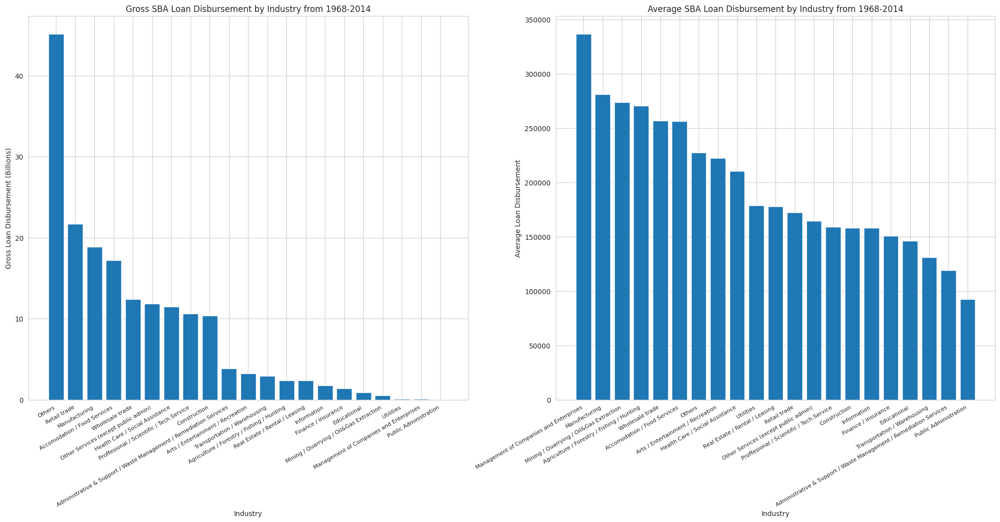

In [59]:
industry_group = df.groupby(['Industry'])

df_industrySum = industry_group.sum(numeric_only=True).sort_values('DisbursementGross', ascending=False)
df_industryAve = industry_group.mean(numeric_only=True).sort_values('DisbursementGross', ascending=False)

fig = plt.figure(figsize=(25,10))

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

ax1.bar(df_industrySum.index, df_industrySum['DisbursementGross'] / 1000000000)
ax1.set_xticks(range(len(df_industrySum.index)))
ax1.set_xticklabels(df_industrySum.index, rotation=30, ha='right', fontsize=8)

ax1.set_title('Gross SBA Loan Disbursement by Industry from 1968-2014', fontsize=12)
ax1.set_xlabel('Industry', fontsize = 10)
ax1.set_ylabel('Gross Loan Disbursement (Billions)', fontsize = 10)

ax2.bar(df_industryAve.index, df_industryAve['DisbursementGross'])
ax2.set_xticks(range(len(df_industryAve.index)))
ax2.set_xticklabels(df_industryAve.index, rotation=30, ha='right', fontsize=8)

ax2.set_title('Average SBA Loan Disbursement by Industry from 1968-2014', fontsize=12)
ax2.set_xlabel('Industry',  fontsize = 10)
ax2.set_ylabel('Average Loan Disbursement',  fontsize = 10)

plt.show()

In [60]:
print(df.shape)
df.isnull().sum()

(886240, 29)


LoanNr_ChkDgt             0
Name                      0
City                      0
State                     0
Zip                       0
Bank                      0
BankState                 0
NAICS                     0
ApprovalDate              0
ApprovalFY                0
Term                      0
NoEmp                     0
NewExist                  0
CreateJob                 0
RetainedJob               0
FranchiseCode             0
UrbanRural                0
RevLineCr                 0
LowDoc                    0
ChgOffDate           725369
DisbursementDate          0
DisbursementGross         0
BalanceGross              0
MIS_Status                0
ChgOffPrinGr              0
GrAppv                    0
SBA_Appv                  0
Industry                  0
Default                   0
dtype: int64

# Stage 2 - Pre-Processing

### Handle missing values

In [61]:
df1 = data.copy()

In [62]:
df1.isnull().sum()

LoanNr_ChkDgt             0
Name                     14
City                     30
State                    14
Zip                       0
Bank                   1559
BankState              1566
NAICS                     0
ApprovalDate              0
ApprovalFY                0
Term                      0
NoEmp                     0
NewExist                136
CreateJob                 0
RetainedJob               0
FranchiseCode             0
UrbanRural                0
RevLineCr              4528
LowDoc                 2582
ChgOffDate           736465
DisbursementDate       2368
DisbursementGross         0
BalanceGross              0
MIS_Status             1997
ChgOffPrinGr              0
GrAppv                    0
SBA_Appv                  0
dtype: int64

The early Dataset has 27 columns with 11 columns have missing-values, the action is:

A. Deleting all the rows that have insignificant missing values (less than 5000)
1. Name
2. City
3. State
4. Bank
5. BankState
6. NewExist
7. RevLineCr
8. LowDoc
9. DisbursementDate
10. MIS_Status 

B. Deleting the column that has significant missing values (736465 rows) : 
11. ChgOffDate

In [63]:
df1.dropna(subset = ['Name', 'City', 'State', 'Bank','BankState', 'NewExist','RevLineCr', 'LowDoc', 'DisbursementDate', 'MIS_Status'],   inplace = True)
df1.isnull().sum()

LoanNr_ChkDgt             0
Name                      0
City                      0
State                     0
Zip                       0
Bank                      0
BankState                 0
NAICS                     0
ApprovalDate              0
ApprovalFY                0
Term                      0
NoEmp                     0
NewExist                  0
CreateJob                 0
RetainedJob               0
FranchiseCode             0
UrbanRural                0
RevLineCr                 0
LowDoc                    0
ChgOffDate           725369
DisbursementDate          0
DisbursementGross         0
BalanceGross              0
MIS_Status                0
ChgOffPrinGr              0
GrAppv                    0
SBA_Appv                  0
dtype: int64

In [64]:
df1 = df1.drop(columns = ['ChgOffDate'], axis = 1)

In [65]:
df1.shape

(886240, 26)

After handling missing value, data's rows & columns:

rows: 899164 to 886240

columns: 27 to 26

### Handle duplicated data

In [66]:
df1.duplicated().any()

False

None of the rows have duplicated data


### Handle outliers

In [67]:
# Dataset from Stage 1 after clear formatting
# 26 columns + Industry (extraction from NAICS) + Default (extraction from MIS_Status)
df_cl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 886240 entries, 0 to 899163
Data columns (total 28 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   LoanNr_ChkDgt      886240 non-null  int64         
 1   Name               886240 non-null  object        
 2   City               886240 non-null  object        
 3   State              886240 non-null  object        
 4   Zip                886240 non-null  object        
 5   Bank               886240 non-null  object        
 6   BankState          886240 non-null  object        
 7   NAICS              886240 non-null  int64         
 8   ApprovalDate       886240 non-null  datetime64[ns]
 9   ApprovalFY         886240 non-null  int16         
 10  Term               886240 non-null  int64         
 11  NoEmp              886240 non-null  int64         
 12  NewExist           886240 non-null  int8          
 13  CreateJob          886240 non-null  int64   

In [68]:
# 26 columns are categorized as such:
# 14 categoricals
categorical = ['LoanNr_ChkDgt', 'Name', 'City', 'State', 'Zip', 'Bank', 'BankState', 'NAICS', 
               'NewExist', 'FranchiseCode', 'UrbanRural', 'RevLineCr', 'LowDoc','MIS_Status']
# 10 numericals
numericals = ['ApprovalFY', 'Term', 'NoEmp', 'CreateJob', 'RetainedJob', 
              'DisbursementGross', 'BalanceGross', 'ChgOffPrinGr', 'GrAppv', 'SBA_Appv']

# 2 timestamp 
timestamp = ['ApprovalDate','DisbursementDate']

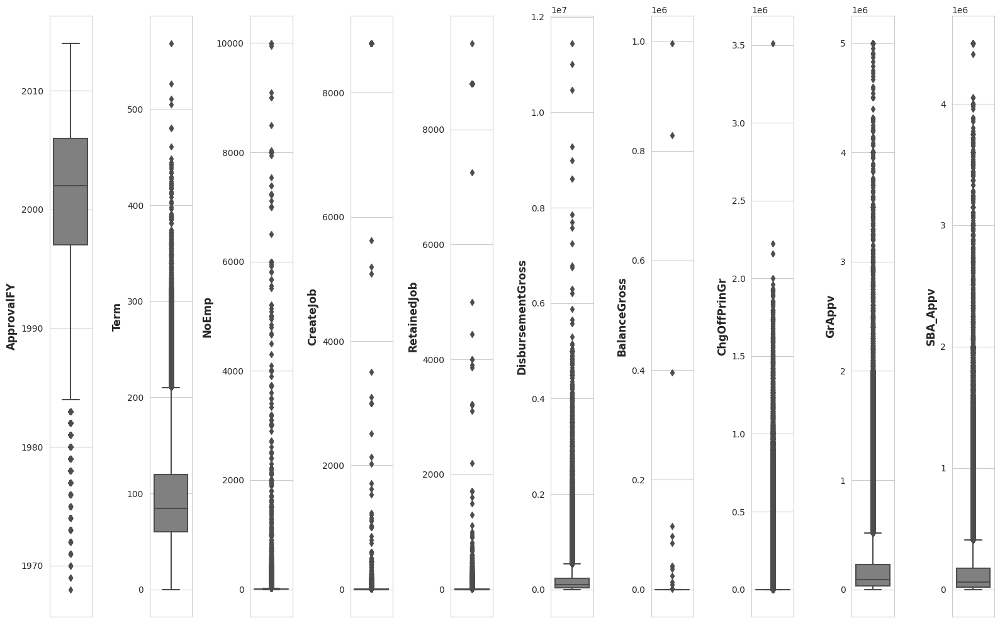

In [69]:
# before handling outliers
fig = plt.figure(figsize=(16, 10))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(1, len(numericals), i+1)
    sns.boxplot(y=df_cl[numericals[i]], color='gray', orient='v', ax=ax)
    ax.set_ylabel(numericals[i], fontdict={'fontsize': 12, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

In [70]:
print(f'number of rows before handling outliers : {len(df_cl)}')

filtered_entries = np.array([True] * len(df_cl))

for col in numericals :
    zscore = abs(stats.zscore(df_cl[col])) # hitung absolute z-scorenya
    filtered_entries = (zscore < 3) & filtered_entries # keep yang kurang dari 3 absolute z-scorenya
    
df_outlier = df_cl[filtered_entries] # filter, cuma ambil yang z-scorenya dibawah 3

print(f'number of rows after handling outliers: {len(df_outlier)}')
print(f'percentage of row removed after handling outlier: {(1-len(df_outlier)/len(df_cl))*100}%')

number of rows before handling outliers : 886240
number of rows after handling outliers: 844388
percentage of row removed after handling outlier: 4.722422820003613%


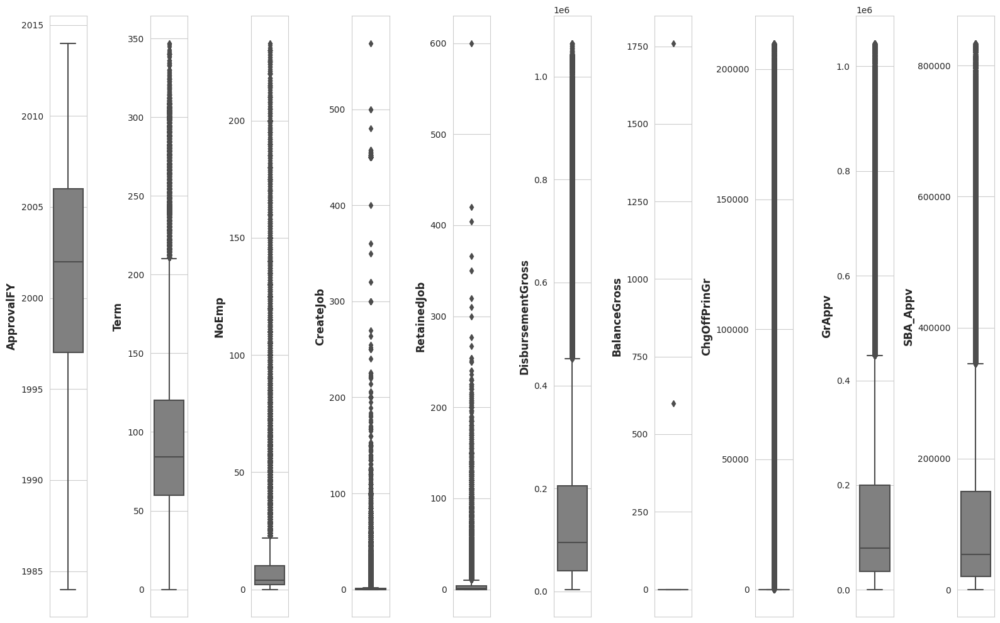

In [71]:
#outliers after z-score trimming
fig = plt.figure(figsize=(16, 10))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(1, len(numericals), i+1)
    sns.boxplot(y=df_outlier[numericals[i]], color='gray', orient='v', ax=ax)
    ax.set_ylabel(numericals[i], fontdict={'fontsize': 12, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

using z-score, rows went from: 886240 to 859255 (remove 3,04%)

Justification:
"It is possible to use classification with a lot of outliers, but it can be challenging to achieve accurate results. ***Outliers can skew the distribution of data and make it difficult for a classification algorithm to accurately classify the data points***. One approach to dealing with outliers is to preprocess the data and remove them. However, *this may not be feasible if the outliers represent important information. Another approach is to use robust classification algorithms that are less sensitive to outliers*. For example, some algorithms, such as Support Vector Machines (SVMs) or Decision Trees, can be designed to handle outliers better than others."

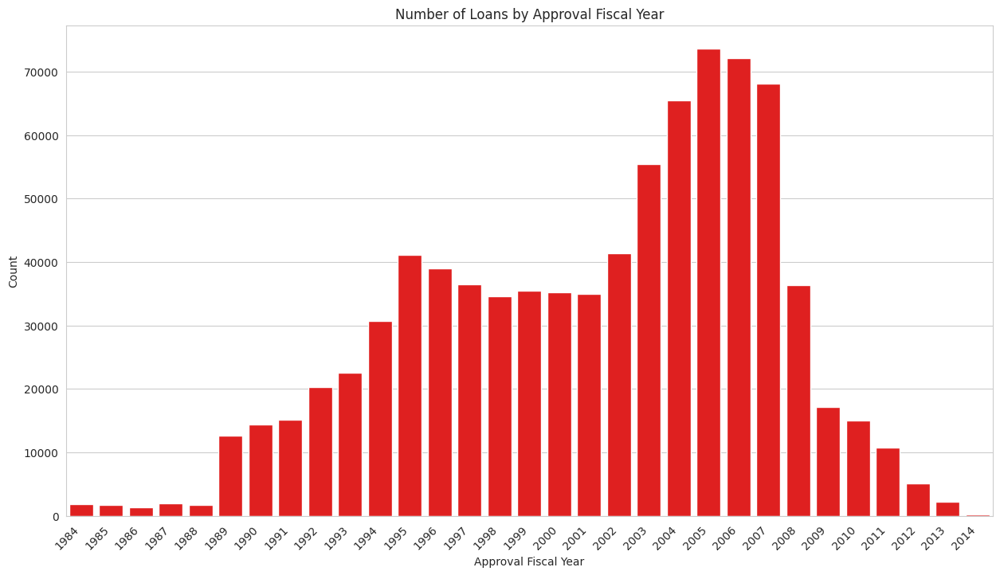

In [72]:
p = df_outlier['ApprovalFY'].value_counts().reset_index().sort_values('index').reset_index(drop=True)
p.columns = ['ApprovalFYear', 'count']

# create figure and axis objects
fig, ax = plt.subplots(1, 1, figsize=(15, 8))

# create barplot
sns.barplot(x='ApprovalFYear', y='count', data=p, ax=ax, color='red')

# set axis labels and title
ax.set_xlabel('Approval Fiscal Year')
ax.set_ylabel('Count')
ax.set_title('Number of Loans by Approval Fiscal Year')
plt.xticks(rotation = 45, fontsize = 10, ha='right')

# show plot
plt.show()

In [73]:
df_cl = df_outlier.copy()

## Feature Transformation

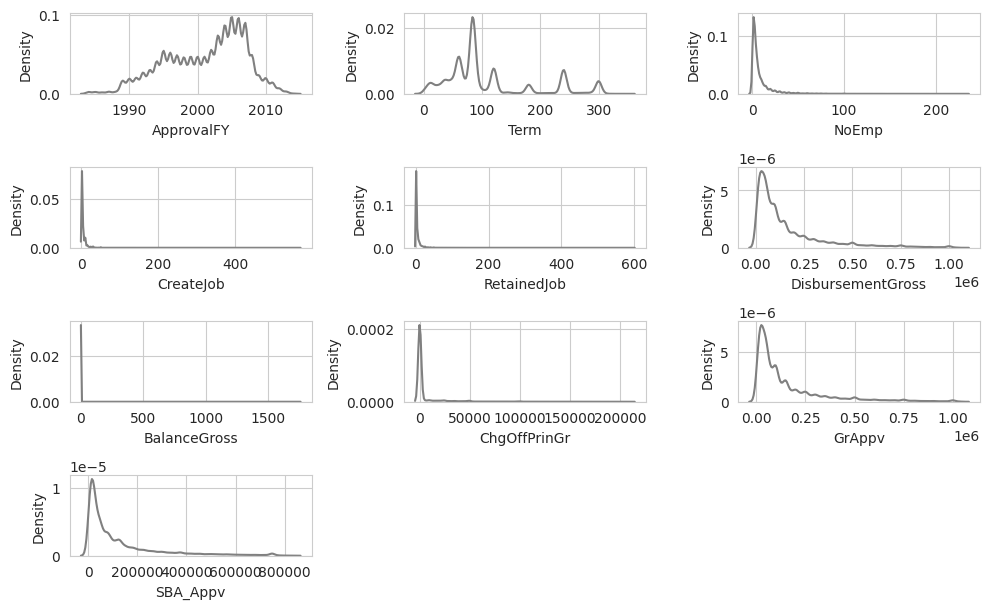

In [74]:
# before feature transformation
fig = plt.figure(figsize=(10, 15))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(len(numericals), 3, i+1)
    sns.kdeplot(x=df_cl[numericals[i]], color='gray', ax=ax)
    # ax.set_title(numericals[i], fontdict={'fontsize': 10, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

In [75]:
df_cl_log = df_cl.copy()
df_cl_log[numericals] = np.log10(df_cl_log[numericals]+1)

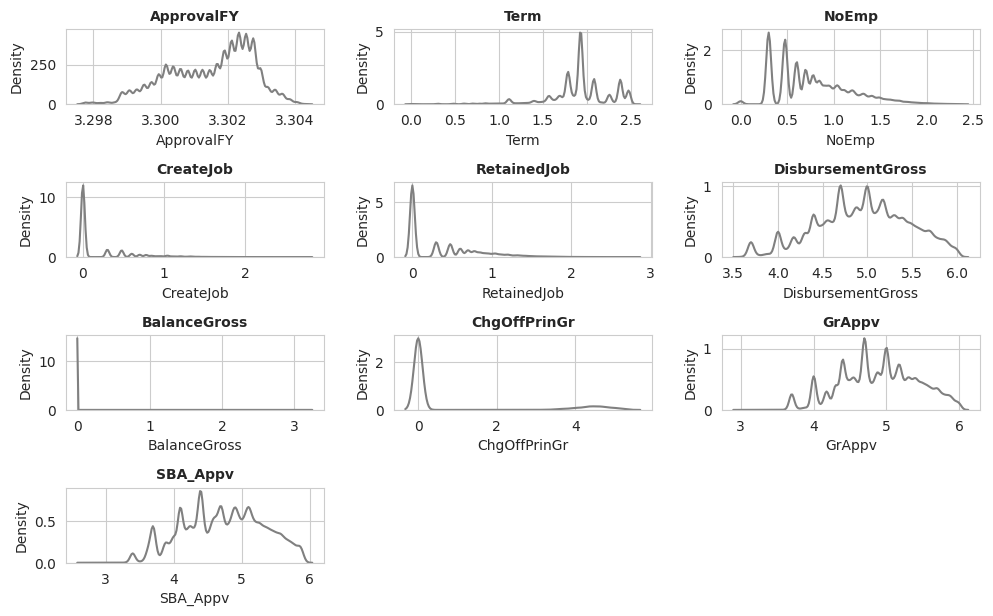

In [76]:
# After feature transformation
fig = plt.figure(figsize=(10, 15))

# create a set of boxplots
for i in range(0, len(numericals)):
    ax = plt.subplot(len(numericals), 3, i+1)
    sns.kdeplot(x=df_cl_log[numericals[i]], color='gray', ax=ax)
    ax.set_title(numericals[i], fontdict={'fontsize': 10, 'fontweight': 'bold'})

plt.tight_layout()
plt.show()

In [77]:
df_cl.describe()

,LoanNr_ChkDgt,NAICS,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,DisbursementGross,BalanceGross,ChgOffPrinGr,GrAppv,SBA_Appv,Default
count,8.443880e+05,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,8.443880e+05,844388.000000,844388.000000,8.443880e+05,844388.000000,844388.000000
mean,4.770741e+09,400204.394322,2001.195604,107.572675,9.341144,1.281054,1.778268,3.995263,2633.511292,0.757720,1.635109e+05,0.002795,7378.793967,1.555628e+05,120456.935555,0.166651
std,2.541401e+09,262452.629299,5.714646,76.692019,16.100043,0.451992,7.587061,10.505758,12512.474279,0.646587,1.901569e+05,2.023560,23745.343725,1.902442e+05,156293.317680,0.372664
min,1.000014e+09,0.000000,1984.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000e+03,0.000000,0.000000,1.000000e+03,500.000000,0.000000
25%,2.569993e+09,235310.000000,1997.000000,60.000000,2.000000,1.000000,0.000000,0.000000,1.000000,0.000000,4.000000e+04,0.000000,0.000000,3.500000e+04,20000.000000,0.000000
50%,4.368319e+09,446110.000000,2002.000000,84.000000,4.000000,1.000000,0.000000,1.000000,1.000000,1.000000,9.500000e+04,0.000000,0.000000,8.000000e+04,54000.000000,0.000000
75%,6.895577e+09,561730.000000,2006.000000,120.000000,10.000000,2.000000,1.000000,4.000000,1.000000,1.000000,2.050000e+05,0.000000,0.000000,2.000000e+05,150000.000000,0.000000
max,9.996003e+09,928120.000000,2014.000000,347.000000,233.000000,2.000000,569.000000,600.000000,99999.000000,2.000000,1.065000e+06,1760.000000,209982.000000,1.044000e+06,834300.000000,1.000000


In [78]:
df_cl_log.describe()

,LoanNr_ChkDgt,NAICS,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,DisbursementGross,BalanceGross,ChgOffPrinGr,GrAppv,SBA_Appv,Default
count,8.443880e+05,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000,844388.000000
mean,4.770741e+09,400204.394322,3.301505,1.921051,0.780625,1.281054,0.196224,0.377954,2633.511292,0.757720,4.946748,0.000007,0.759608,4.900140,4.734005,0.166651
std,2.541401e+09,262452.629299,0.001240,0.348528,0.405994,0.451992,0.355711,0.455721,12512.474279,0.646587,0.509634,0.004650,1.679459,0.530172,0.587454,0.372664
min,1.000014e+09,0.000000,3.297760,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.602169,0.000000,0.000000,3.000434,2.699838,0.000000
25%,2.569993e+09,235310.000000,3.300596,1.785330,0.477121,1.000000,0.000000,0.000000,1.000000,0.000000,4.602071,0.000000,0.000000,4.544080,4.301052,0.000000
50%,4.368319e+09,446110.000000,3.301681,1.929419,0.698970,1.000000,0.000000,0.301030,1.000000,1.000000,4.977728,0.000000,0.000000,4.903095,4.732402,0.000000
75%,6.895577e+09,561730.000000,3.302547,2.082785,1.041393,2.000000,0.301030,0.698970,1.000000,1.000000,5.311756,0.000000,0.000000,5.301032,5.176094,0.000000
max,9.996003e+09,928120.000000,3.304275,2.541579,2.369216,2.000000,2.755875,2.778874,99999.000000,2.000000,6.027350,3.245759,5.322184,6.018701,5.921323,1.000000


In [79]:
df_n = df_cl_log.copy()

df_n

,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,...,LowDoc,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv,Industry,Default
0,1000014003,ABC HOBBYCRAFT,EVANSVILLE,IN,47711,FIFTH THIRD BANK,OH,451120,1997-02-28,3.300596,...,Y,1999-02-28,4.778158,0.0,P I F,0.000000,4.778158,4.681250,Retail trade,0
1,1000024006,LANDMARK BAR & GRILLE (THE),NEW PARIS,IN,46526,1ST SOURCE BANK,IN,722410,1997-02-28,3.300596,...,Y,1997-05-31,4.602071,0.0,P I F,0.000000,4.602071,4.505164,Accomodation / Food Services,0
2,1000034009,"WHITLOCK DDS, TODD M.",BLOOMINGTON,IN,47401,GRANT COUNTY STATE BANK,IN,621210,1997-02-28,3.300596,...,N,1997-12-31,5.457883,0.0,P I F,0.000000,5.457883,5.332945,Health Care / Social Assistance,0
3,1000044001,"BIG BUCKS PAWN & JEWELRY, LLC",BROKEN ARROW,OK,74012,1ST NATL BK & TR CO OF BROKEN,OK,0,1997-02-28,3.300596,...,Y,1997-06-30,4.544080,0.0,P I F,0.000000,4.544080,4.447174,Others,0
4,1000054004,"ANASTASIA CONFECTIONS, INC.",ORLANDO,FL,32801,FLORIDA BUS. DEVEL CORP,FL,0,1997-02-28,3.300596,...,N,1997-05-14,5.359837,0.0,P I F,0.000000,5.359837,5.359837,Others,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
899159,9995573004,FABRIC FARMS,UPPER ARLINGTON,OH,43221,JPMORGAN CHASE BANK NATL ASSOC,IL,451120,1997-02-27,3.300596,...,N,1997-09-30,4.845104,0.0,P I F,0.000000,4.845104,4.748196,Retail trade,0
899160,9995603000,FABRIC FARMS,COLUMBUS,OH,43221,JPMORGAN CHASE BANK NATL ASSOC,IL,451130,1997-02-27,3.300596,...,N,1997-10-31,4.929424,0.0,P I F,0.000000,4.929424,4.628399,Retail trade,0
899161,9995613003,"RADCO MANUFACTURING CO.,INC.",SANTA MARIA,CA,93455,"RABOBANK, NATIONAL ASSOCIATION",CA,332321,1997-02-27,3.300596,...,N,1997-09-30,5.477123,0.0,P I F,0.000000,5.477123,5.352184,Manufacturing,0
899162,9995973006,"MARUTAMA HAWAII, INC.",HONOLULU,HI,96830,BANK OF HAWAII,HI,0,1997-02-27,3.300596,...,Y,1997-03-31,4.875067,0.0,CHGOFF,4.666368,4.875067,4.778158,Others,1


## Feature Encoding


14 categoricals:

1. LoanNr_ChkDgt
2. Name
3. City
4. State
5. Zip
6. Bank
7. BankState
8. UrbanRural 

these following categories would be handled in feature encoding:

9. NewExist --> create 'New Business: 1/0
10. FranchiseCode --> create 'IsFrenchise'
11. RevLineCr --> boolean 0/1
12. 'LowDoc'--> boolean 0/1
13. 'MIS_Status' --> create 'Default'
14. NAICS --> Industry


Now, we convert the FranchiseCode column to a binary column, based on if whether it is or it isn't a franchise, referring the file along with the dataset.

In [80]:
# Create flag column IsFranchise based on FranchiseCode column
df_n.loc[(df_n['FranchiseCode'] <= 1), 'IsFranchise'] = 0
df_n.loc[(df_n['FranchiseCode'] > 1), 'IsFranchise'] = 1

Next we look at some of the fields that are considered flags already but aren't necessarily in a useable format right now. These include the NewExist, RevLineCr, LowDoc fields.

In [81]:
# NewExist
# Makesure NewExist has only 1s and 2s; Remove records where NewExist isn't 1 or 2
df_n['NewExist'].unique()

array([2, 1, 0], dtype=int8)

In [82]:
# Keep records where NewExist == 1 or 2
df_n = df_n[(df_n['NewExist'] == 1) | (df_n['NewExist'] == 2)]

# Create NewBusiness field where 0 = Existing business and 1 = New business; based on NewExist field
df_n.loc[(df_n['NewExist'] == 1), 'NewBusiness'] = 0
df_n.loc[(df_n['NewExist'] == 2), 'NewBusiness'] = 1

# Check that it worked
print(df_n['NewBusiness'].unique())

[1. 0.]


<ipython-input-82-8cffb19e2139>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_n.loc[(df_n['NewExist'] == 1), 'NewBusiness'] = 0


In [83]:
# RevLineCr and LowDoc
# Double check RevLineCr and LowDoc unique values
df_n['RevLineCr'].unique()

array(['N', '0', 'Y', 'T', '`', ',', '1', 'C', '3', '2', 'R', '7', 'A',
       '5', '.', '-', 'Q'], dtype=object)

In [84]:
df_n['LowDoc'].unique()

array(['Y', 'N', 'C', '1', 'S', 'R', 'A', '0'], dtype=object)

In [85]:
# Remove records where RevLineCr != 'Y' or 'N' and LowDoc != 'Y' or 'N'
df_n = df_n[(df_n['RevLineCr'] == 'Y') | (df_n['RevLineCr'] == 'N')]
df_n = df_n[(df_n['LowDoc'] == 'Y') | (df_n['LowDoc'] == 'N')]

# RevLineCr and LowDoc: 0 = No, 1 = Yes
df_n['RevLineCr'] = np.where(df_n['RevLineCr'] == 'N', 0, 1)
df_n['LowDoc'] = np.where(df_n['LowDoc'] == 'N', 0, 1)

# Check that it worked
print(df_n['RevLineCr'].unique())
print(df_n['LowDoc'].unique())

[0 1]
[1 0]


Now that the flag fields have been addressed, let's tackle the date fields.

One metric we thought of that would be interesting to see is the number of days it took from the approval of the loan to the actual disbursement of the funds. My hypothesis is that the timing at which the funds were received could have a negative relationship with a business's ability to repay a loan, whereas the longer it took to receive funds, the more difficult it would be to pay off the loan. In my experience as a Credit Analyst, there were a number of businesses that needed loan funding urgently to help the business stay afloat. I'm sure this would vary by industry however.

In [86]:
# Create DaysToDisbursement column which calculates the number of days passed between DisbursementDate and ApprovalDate
df_n['DaysToDisbursement'] = df_n['DisbursementDate'] - df_n['ApprovalDate']

# Change DaysToDisbursement from a timedelta64 dtype to an int64 dtype
# Converts series to str, removes all characters after the space before 'd' in days for each record, then changes the dtype to int
df_n['DaysToDisbursement'] = df_n['DaysToDisbursement'].astype('str').apply(lambda x: x[:x.index('d') - 1]).astype('int64')

<Axes: >

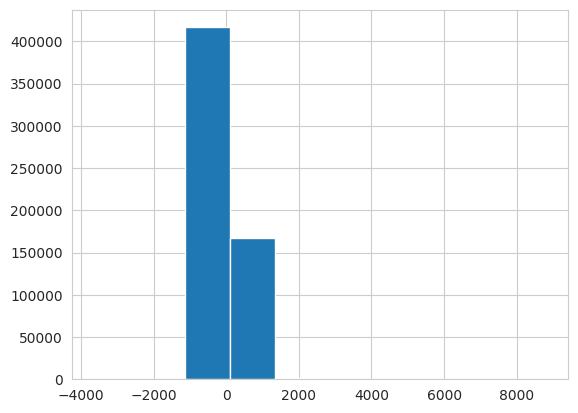

In [87]:
df_n['DaysToDisbursement'].hist()

In [88]:
df_n['DaysToDisbursement'].describe()

count    586094.000000
mean        118.861852
std         191.237677
min       -3614.000000
25%          30.000000
50%          61.000000
75%         124.000000
max        8799.000000
Name: DaysToDisbursement, dtype: float64

In [89]:
# Create DisbursementFY field for time selection criteria later
df_n['DisbursementFY'] = df_n['DisbursementDate'].map(lambda x: x.year)

<Axes: >

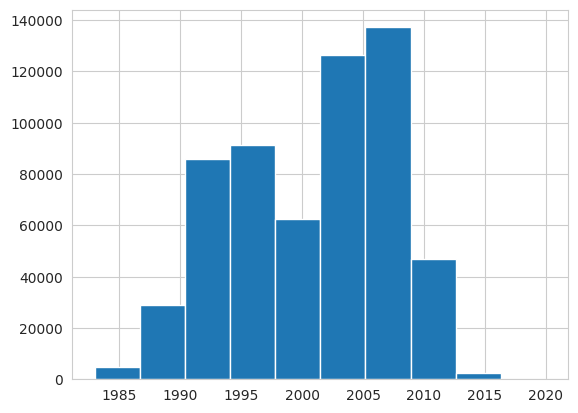

In [90]:
df_n['DisbursementFY'].hist()

In [91]:
df_n['DisbursementFY'].describe()

count    586094.000000
mean       2000.870007
std           6.369352
min        1983.000000
25%        1995.000000
50%        2003.000000
75%        2006.000000
max        2020.000000
Name: DisbursementFY, dtype: float64

Another metric I was interested in exploring is whether or not the bank servicing the loan was in the same state that the business was located. My assumption is that it would be more difficult to service a loan for a business in another state and that this could have a negative impact on a business's ability to repay the loan.

In [92]:
# Create StateSame flag field which identifies where the business State is the same as the BankState
df_n['StateSame'] = np.where(df_n['State'] == df_n['BankState'], 1, 0)

# Check that it worked
print(df_n['StateSame'].unique())

[0 1]


In [93]:
df_n.UrbanRural.unique()

array([0, 1, 2], dtype=int8)

The next field I decided to create relates to the amount of the loan the SBA guaranteed. This is a unique feature SBA loans have where the SBA will 'guaranty' a percentage of the loan in the event of a loss. For example if a business took out a 500,000 loan and the SBA guaranteed 50%, if the business was unable to repay 200,000 of the loan the SBA would cover 100,000 of that loss. This makes these loans very attractive to small businesses because it mitigates their risk, but it also increases the risk for the SBA. This is why an analysis like this is important! These loans are typically guaranteed on a percentage basis rather than a specified dollar amount, so I create a field to represent this rather than the guaranteed amount provided in the original dataset.

In [94]:
# Create SBA_AppvPct field since the guaranteed amount is based on a percentage of the gross loan amount rather than dollar amount in most situations
df_n['SBA_AppvPct'] = df_n['SBA_Appv'] / df_n['GrAppv']

<Axes: >

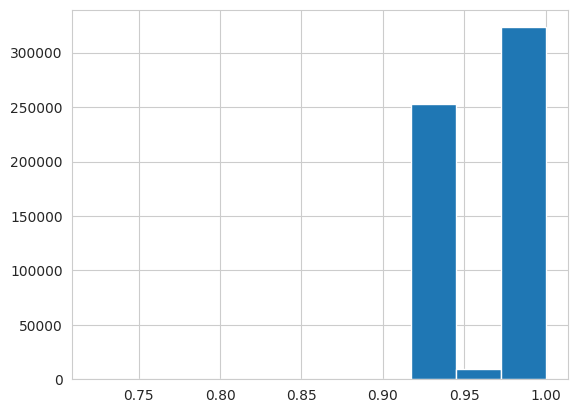

In [95]:
df_n['SBA_AppvPct'].hist()

I wanted to look at whether the loan amount disbursed was equal to the full amount approved, so I added that feature as well.

In [96]:
# Create AppvDisbursed flag field signifying if the loan amount disbursed was equal to the full amount approved
df_n['AppvDisbursed'] = np.where(df_n['DisbursementGross'] == df_n['GrAppv'], 1, 0)

Now that we've done a lot of formatting to the data, let's make sure the data types are still correct.

In [97]:
df_n.dtypes

LoanNr_ChkDgt                  int64
Name                          object
City                          object
State                         object
Zip                           object
Bank                          object
BankState                     object
NAICS                          int64
ApprovalDate          datetime64[ns]
ApprovalFY                   float32
Term                         float64
NoEmp                        float64
NewExist                        int8
CreateJob                    float64
RetainedJob                  float64
FranchiseCode                  int64
UrbanRural                      int8
RevLineCr                      int64
LowDoc                         int64
DisbursementDate      datetime64[ns]
DisbursementGross            float64
BalanceGross                 float64
MIS_Status                    object
ChgOffPrinGr                 float64
GrAppv                       float64
SBA_Appv                     float64
Industry                      object
D

In [98]:
# Format dtypes where necessary after feature engineering
df_n = df_n.astype({'IsFranchise': 'int8', 'NewBusiness': 'int8', 'RevLineCr': 'int8', 'LowDoc': 'int8', 'StateSame' : 'int8', 
                'Default' : 'int8', 'DisbursementFY' : 'int16', 'DaysToDisbursement' : 'int16'})
df_n.dtypes

LoanNr_ChkDgt                  int64
Name                          object
City                          object
State                         object
Zip                           object
Bank                          object
BankState                     object
NAICS                          int64
ApprovalDate          datetime64[ns]
ApprovalFY                   float32
Term                         float64
NoEmp                        float64
NewExist                        int8
CreateJob                    float64
RetainedJob                  float64
FranchiseCode                  int64
UrbanRural                      int8
RevLineCr                       int8
LowDoc                          int8
DisbursementDate      datetime64[ns]
DisbursementGross            float64
BalanceGross                 float64
MIS_Status                    object
ChgOffPrinGr                 float64
GrAppv                       float64
SBA_Appv                     float64
Industry                      object
D

In [99]:
df_n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 586094 entries, 0 to 899163
Data columns (total 35 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   LoanNr_ChkDgt       586094 non-null  int64         
 1   Name                586094 non-null  object        
 2   City                586094 non-null  object        
 3   State               586094 non-null  object        
 4   Zip                 586094 non-null  object        
 5   Bank                586094 non-null  object        
 6   BankState           586094 non-null  object        
 7   NAICS               586094 non-null  int64         
 8   ApprovalDate        586094 non-null  datetime64[ns]
 9   ApprovalFY          586094 non-null  float32       
 10  Term                586094 non-null  float64       
 11  NoEmp               586094 non-null  float64       
 12  NewExist            586094 non-null  int8          
 13  CreateJob           586094 no

## Feature selection

Now that each field we care about appears to have the correct data type, we can remove the fields that won't provide much value to the analysis. These are as follows:
* LoanNr_ChkDgt and Name - provides no value to the actual analysis
* City and Zip - each have a large number of unique values, and my assumption is that it is not likely either would have any particularly significant values 
* Bank - Name of the bank shouldn't matter for analysis, however this could potentially be used when revisiting this analysis to determine the asset size of the bank servicing the loan
* ChgOffDate - only applies when a loan is charged off and isn't relevant to the analysis
* NAICS - replaced by Industry
* NewExist - replaced by NewBusiness flag field
* FranchiseCode - replaced by IsFranchise flag field
* ApprovalDate and DisbursementDate - hypothesis that DaysToDisbursement will be more valueable
* SBA_Appv - guaranteed amount is based on percentage of gross loan amount, not dollar amount typically
* MIS_Status - Default field replaces this as the target field

In [100]:
df_n.drop(columns=['LoanNr_ChkDgt', 'Name', 'City', 'Zip', 'Bank', 'NAICS', 'ApprovalDate', 'NewExist', 
                   'FranchiseCode', 'DisbursementDate', 'BalanceGross', 'ChgOffPrinGr', 'SBA_Appv', 'MIS_Status'], inplace=True)

In [101]:
# Verify all null values are removed from data
df_n.isnull().sum()

State                 0
BankState             0
ApprovalFY            0
Term                  0
NoEmp                 0
CreateJob             0
RetainedJob           0
UrbanRural            0
RevLineCr             0
LowDoc                0
DisbursementGross     0
GrAppv                0
Industry              0
Default               0
IsFranchise           0
NewBusiness           0
DaysToDisbursement    0
DisbursementFY        0
StateSame             0
SBA_AppvPct           0
AppvDisbursed         0
dtype: int64

In [102]:
# Check the shape of the data as it stands
df_n.shape

(586094, 21)

The last couple of features I wanted to look at are whether a loan was backed by Real Estate, and whether a loan was active during the Great Recession (2007-2009). These were both mentioned in the document which describes the dataset and how it was used for educatoinal purposes, and I think they will be very important features to consider.

To determine whether a loan was backed by Real Estate, I made a flag that signifies if the loan term is >= 20 years, as real estate-backed loans are typically at least this long since the loan term is usually tied to the useful life of the assets used for collateral. Unfortunately there's no way to know this for sure since it is not included explicitely in the data.

For loans active during the Great Recession, I created a flag for loans where the Great Recession (2007-2009) between DisbursementFY and DisbursementFY plus the loan term (in years).

In [123]:
# Field for loans backed by Real Estate (loans with a term of at least 20 years)
df_n['RealEstate'] = np.where(df_n['Term'] >= np.log10(240), 1, 0)

# Field for loans active during the Great Recession (2007-2009)
df_n['GreatRecession'] = np.where(((2007 <= df_n['DisbursementFY']) & (df_n['DisbursementFY'] <= 2009)) | 
                                     ((df_n['DisbursementFY'] < 2007) & (df_n['DisbursementFY'] + (df_n['Term']/12) >= 2007)), 1, 0)

df_n = df_n.astype({'RealEstate': 'int8', 'GreatRecession': 'int8'})

# Check that it worked
print(df_n['RealEstate'].unique())
print(df_n['GreatRecession'].unique())

[0 1]
[0 1]


In [124]:
df_n.Term.describe()

count    569159.000000
mean          1.901371
std           0.353209
min           0.000000
25%           1.785330
50%           1.929419
75%           2.082785
max           2.541579
Name: Term, dtype: float64

When it comes to the time period for the records used in the analysis and modeling later, I think the document provided with the dataset had good rationale. This rationale is listed in the 3.3 Time Period section of the document, but to summarize, the emphasis was placed on default rates of loans disbursed through 2010. They wanted to account for the Great Recession and restrict the time frame to loans by excluding those disbursed after 2010 since the loan term is typically 5 years or more.

I wanted to adopt this for my analysis as well, so I set a selection criteria for loans with a disbursement date prior to 2010.

In [125]:
# Select only records with a disbursement year through 2010
df_n = df_n[df_n['DisbursementFY'] <= 2010]

# Check how many records remain
print(df_n.shape)

df_n.dtypes

(569159, 23)


State                  object
BankState              object
ApprovalFY            float32
Term                  float64
NoEmp                 float64
CreateJob             float64
RetainedJob           float64
UrbanRural               int8
RevLineCr                int8
LowDoc                   int8
DisbursementGross     float64
GrAppv                float64
Industry               object
Default                  int8
IsFranchise              int8
NewBusiness              int8
DaysToDisbursement      int16
DisbursementFY          int16
StateSame                int8
SBA_AppvPct           float64
AppvDisbursed           int64
RealEstate               int8
GreatRecession           int8
dtype: object

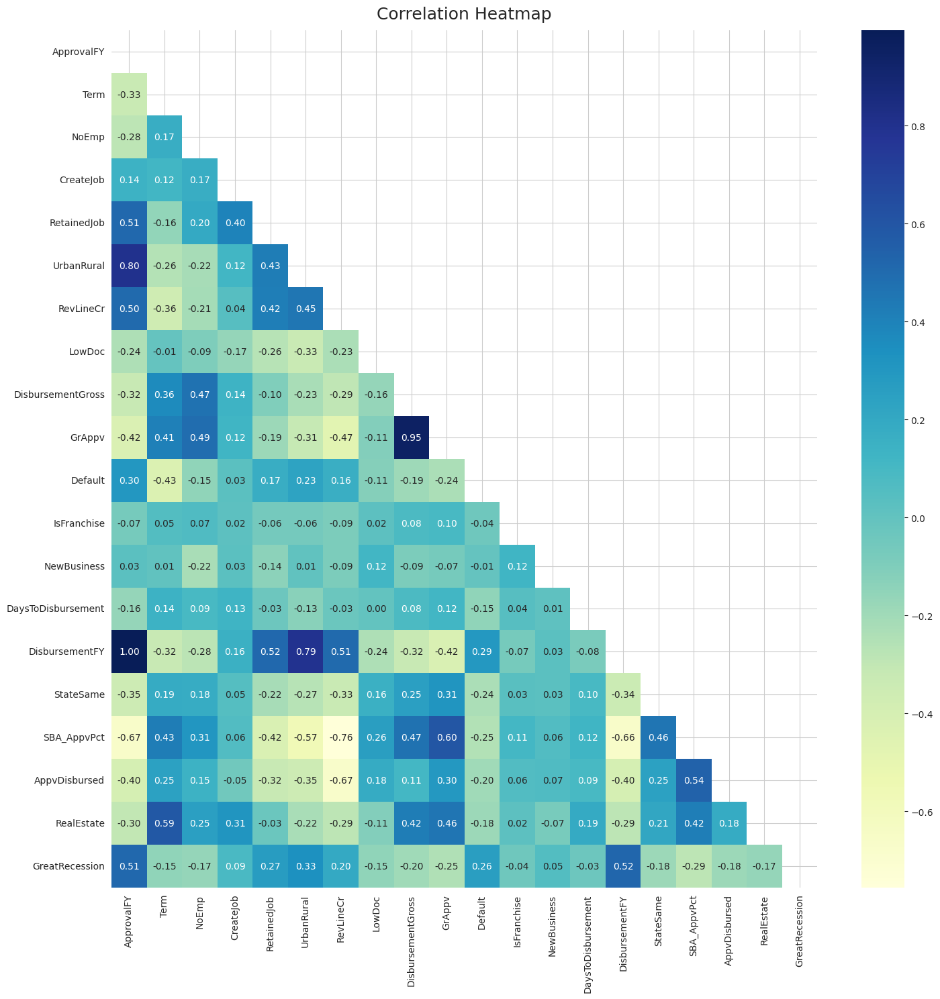

In [126]:
plt.figure(figsize=(15, 15))

p = df_n.corr(numeric_only=True)

mask = np.triu(np.ones_like(p, dtype=bool))
heatmap = sns.heatmap(p, cmap='YlGnBu', mask=mask, annot=True, fmt='.2f')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12)

plt.tight_layout()
plt.show()

<Figure size 1500x1500 with 0 Axes>

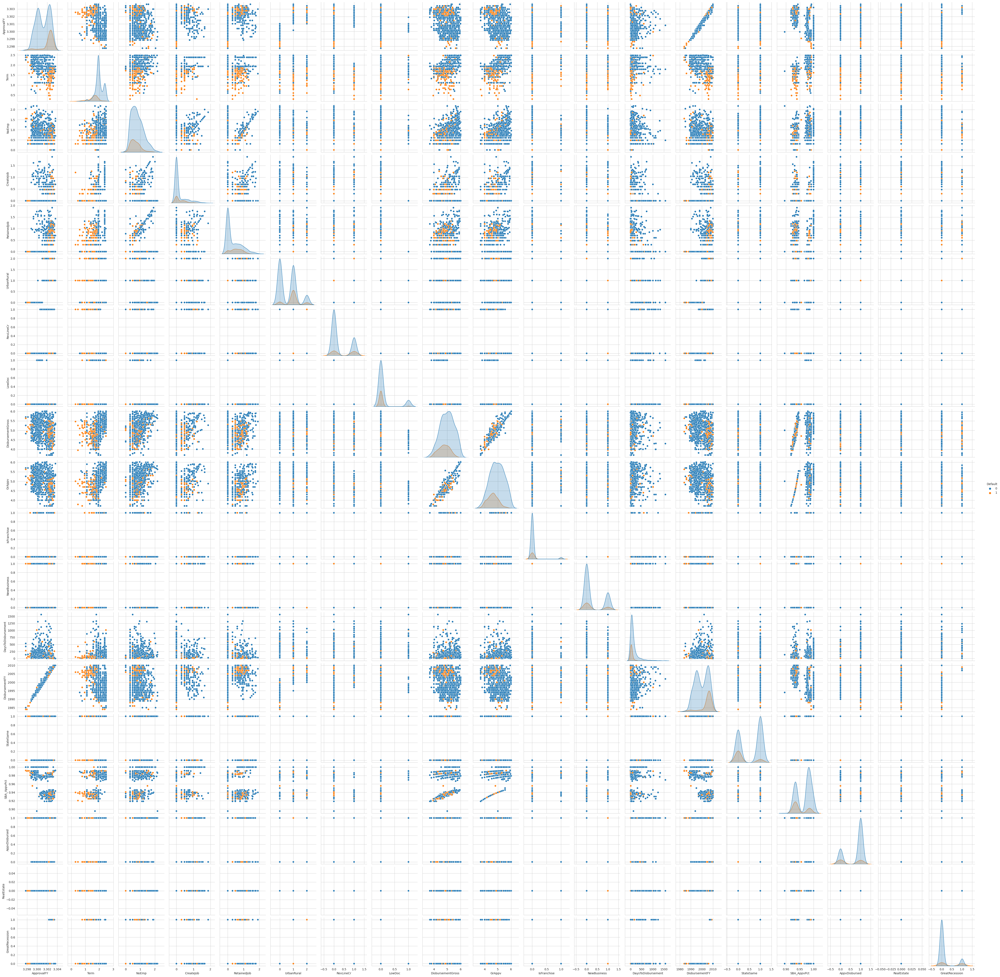

In [106]:
q = df_n.drop(columns=['State', 'BankState', 'Industry']).sample(1000, random_state=0)

plt.figure(figsize=(15, 15))
sns.pairplot(q, diag_kind='kde', hue='Default')

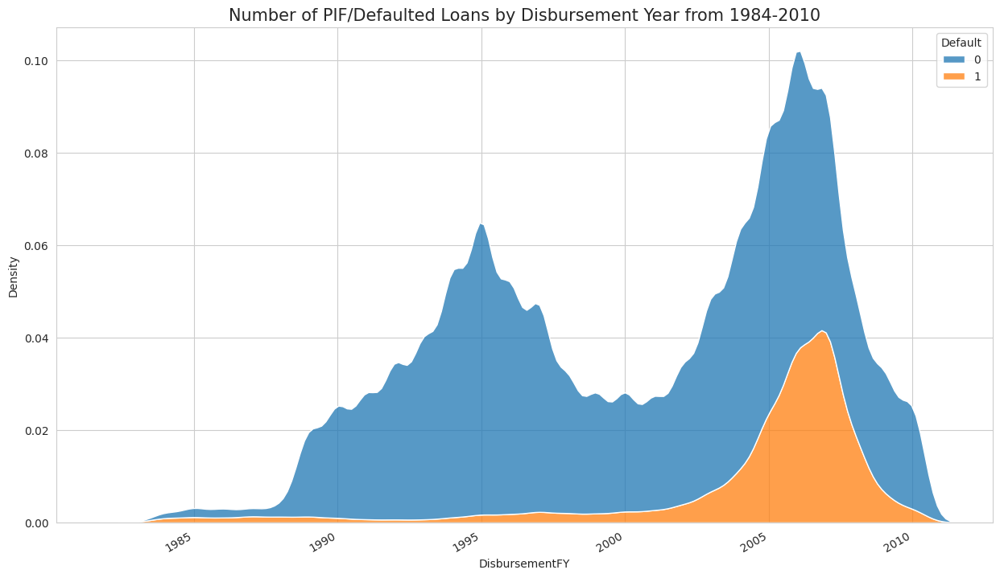

In [127]:
fig, ax = plt.subplots(1, 1, figsize = (15,8))
sns.kdeplot(x = df_n.DisbursementFY, hue=df_n.Default, multiple="stack", ax=ax)
ax.set_title('Number of PIF/Defaulted Loans by Disbursement Year from 1984-2010', fontsize=15)
plt.xticks(rotation = 30, fontsize = 10, horizontalalignment='right')
plt.show()

In [128]:
def_ind = df_n.groupby(['Industry', 'Default'])['Industry'].count().unstack('Default')
def_ind['Def_Percent'] = def_ind[1]/(def_ind[1] + def_ind[0])*100
def_ind['count'] = def_ind[1] + def_ind[0]

def_ind.sort_values('Def_Percent', ascending=False)

Default,0,1,Def_Percent,count
Industry,,,,
Finance / Insurance,3924,2081,34.654455,6005
Real Estate / Rental / Leasing,5950,3042,33.830071,8992
Transportation / Warehousing,9822,4350,30.694327,14172
Educational,2696,1023,27.507394,3719
Information,5086,1779,25.914057,6865
Administrative & Support / Waste Management / Remediation Services,15573,5322,25.470208,20895
Construction,34535,11652,25.227878,46187
Accomodation / Food Services,22611,7440,24.757912,30051
Retail trade,58532,18128,23.647274,76660


In [129]:
def_state = df_n.groupby(['State', 'Default'])['State'].count().unstack('Default')
def_state['Def_Percent'] = def_state[1]/(def_state[1] + def_state[0])*100
def_state['count'] = def_state[1] + def_state[0]

def_state.sort_values('Def_Percent', ascending=False)

Default,0,1,Def_Percent,count
State,,,,
FL,18697,7483,28.582888,26180
AZ,6517,2395,26.873878,8912
NJ,10028,3291,24.709062,13319
NV,3780,1210,24.248497,4990
MI,10203,3255,24.186358,13458
GA,10079,3145,23.782517,13224
IL,15172,4701,23.655211,19873
CA,58552,16186,21.656988,74738
NY,32613,8649,20.961175,41262


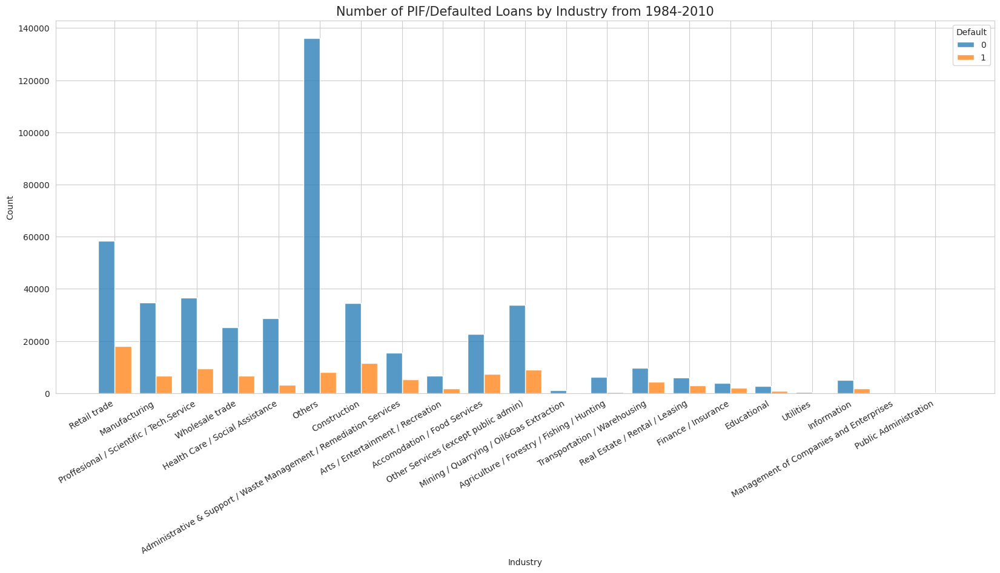

In [130]:
df_a = df_n.sort_values('Default', ascending = True)

fig, ax = plt.subplots(1, 1, figsize = (20,8))
sns.histplot(data=df_a, x="Industry", hue="Default", multiple="dodge", shrink=.8, ax=ax)
ax.set_title('Number of PIF/Defaulted Loans by Industry from 1984-2010', fontsize=15)
plt.xticks(rotation = 30, fontsize = 10, ha='right')
plt.show()

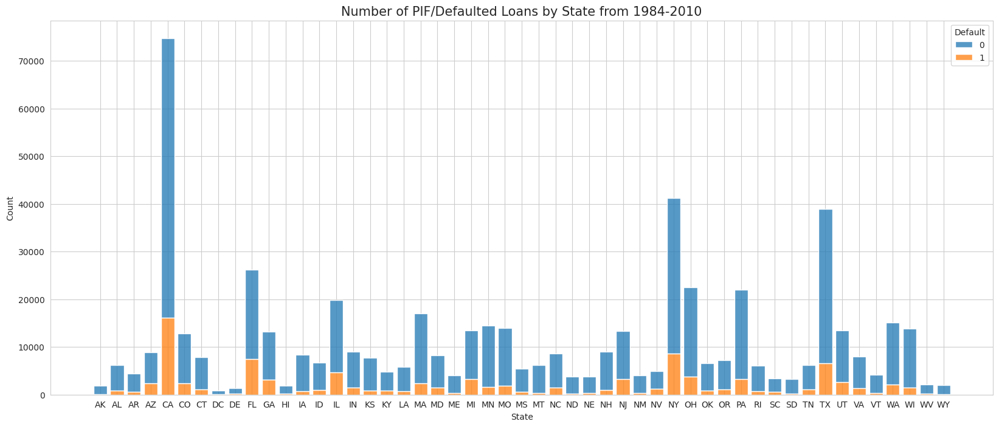

In [131]:
df_a = df_n.sort_values('State', ascending = True)

fig, ax = plt.subplots(1, 1, figsize = (20,8))
sns.histplot(data=df_a, x="State", hue="Default", multiple="stack", shrink=.8, ax=ax)
ax.set_title('Number of PIF/Defaulted Loans by State from 1984-2010', fontsize=15)
# plt.xticks(rotation = 90, fontsize = 10, ha='right')
plt.show()

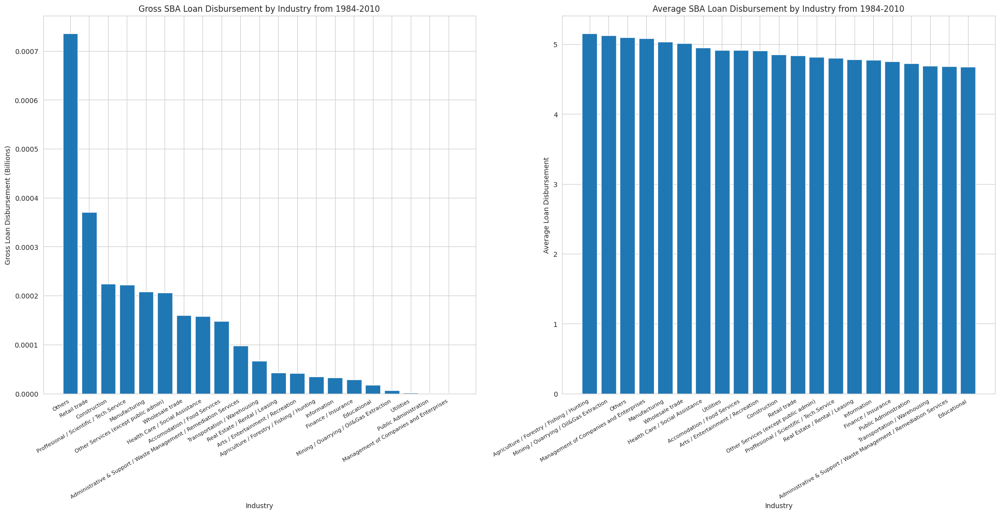

In [132]:
industry_group = df_n.groupby(['Industry'])

df_industrySum = industry_group.sum(numeric_only=True).sort_values('DisbursementGross', ascending=False)
df_industryAve = industry_group.mean(numeric_only=True).sort_values('DisbursementGross', ascending=False)

fig = plt.figure(figsize=(25,10))

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

ax1.bar(df_industrySum.index, df_industrySum['DisbursementGross'] / 1000000000)
ax1.set_xticks(range(len(df_industrySum.index)))
ax1.set_xticklabels(df_industrySum.index, rotation=30, ha='right', fontsize=8)

ax1.set_title('Gross SBA Loan Disbursement by Industry from 1984-2010', fontsize=12)
ax1.set_xlabel('Industry', fontsize = 10)
ax1.set_ylabel('Gross Loan Disbursement (Billions)', fontsize = 10)

ax2.bar(df_industryAve.index, df_industryAve['DisbursementGross'])
ax2.set_xticks(range(len(df_industryAve.index)))
ax2.set_xticklabels(df_industryAve.index, rotation=30, ha='right', fontsize=8)

ax2.set_title('Average SBA Loan Disbursement by Industry from 1984-2010', fontsize=12)
ax2.set_xlabel('Industry',  fontsize = 10)
ax2.set_ylabel('Average Loan Disbursement',  fontsize = 10)

plt.show()

In [133]:
# split dataset into features (X) and target (y)
X = df_n.drop(columns=['Default', 'State', 'BankState', 'Industry'])
y = df_n['Default']

# perform ANOVA feature selection
f_scores, p_values = f_classif(X, y)

# create a dataframe to store feature names, f-scores, and p-values
anova_results = pd.DataFrame({'Features': X.columns, 'F-Scores': f_scores, 'P-Values': p_values})

# sort the dataframe by descending f-scores
anova_results = anova_results.sort_values(by='F-Scores', ascending=False, ignore_index=True)

# print the feature scores
anova_results

,Features,F-Scores,P-Values
0,Term,128859.051332,0.000000e+00
1,ApprovalFY,56579.963393,0.000000e+00
2,DisbursementFY,52602.596560,0.000000e+00
3,GreatRecession,40438.008582,0.000000e+00
4,SBA_AppvPct,38475.241837,0.000000e+00
5,GrAppv,33373.364519,0.000000e+00
6,StateSame,33274.926343,0.000000e+00
7,UrbanRural,32647.773629,0.000000e+00
8,AppvDisbursed,23150.301719,0.000000e+00
9,DisbursementGross,21204.582449,0.000000e+00


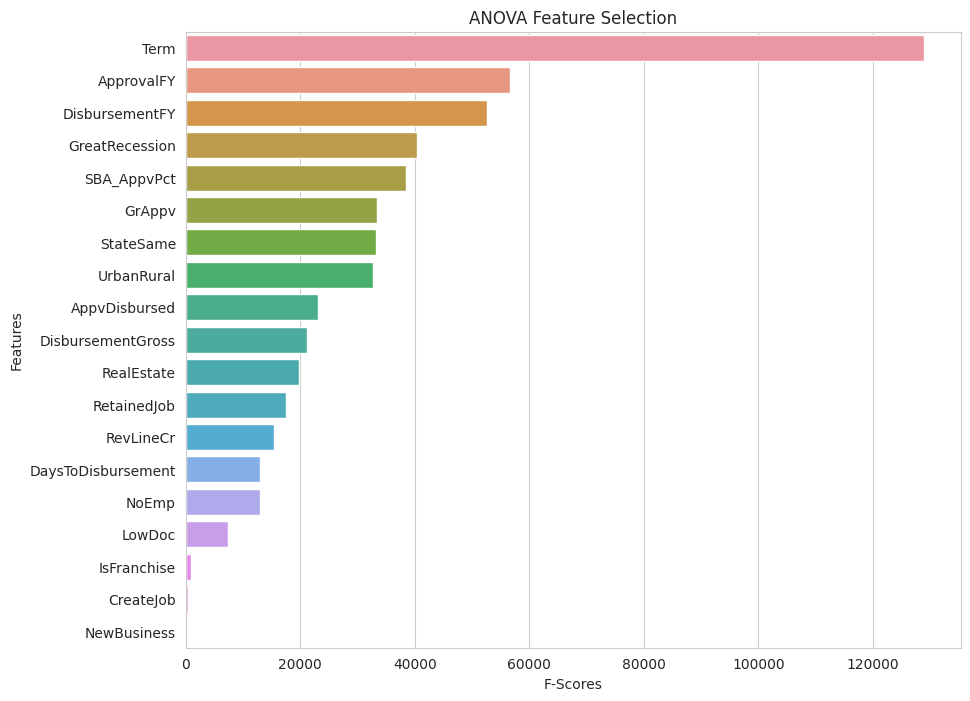

In [134]:
# create horizontal bar plot for f-scores
plt.figure(figsize=(10, 8))
sns.barplot(x='F-Scores', y='Features', data=anova_results, orient='h')
plt.title('ANOVA Feature Selection')
plt.xlabel('F-Scores')
plt.ylabel('Features')
plt.show()

In [135]:
# create a SelectKBest object
selector = SelectKBest(f_classif, k=5)

# fit selector to data
selector.fit(X, y)

# get selected features
selected_features = X.columns[selector.get_support()]

# display selected features
print('Selected features:', list(selected_features))

Selected features: ['ApprovalFY', 'Term', 'DisbursementFY', 'SBA_AppvPct', 'GreatRecession']


In [136]:
# split dataset into features (X) and target (y)
X = df_n[['Industry',	'RevLineCr', 'LowDoc', 'NewBusiness', 'IsFranchise', 'RealEstate', 'GreatRecession']]
y = df_n['Default']

# convert categorical features to numeric using one-hot encoding
X = pd.get_dummies(X, columns=X.columns)

# perform Chi2 feature selection
chi2_scores, p_values = chi2(X, y)

# create a dataframe to store feature names, chi2_scores, and p-values
chi2_results = pd.DataFrame({'Features': X.columns, 'chi2_scores': chi2_scores, 'P-Values': p_values})

# sort the dataframe by descending chi2_scores
chi2_results = chi2_results.sort_values(by='chi2_scores', ascending=False)

# print the feature scores
chi2_results = chi2_results.reset_index(drop=True)

# Only RevLineCr_Y, LowDoc_Y, RevLineCr_Y, LowDoc_N
# chi2_results = chi2_results.drop(chi2_results.index[32:])
# chi2_results = chi2_results.drop([0, 4, 14, 19, 22, 23, 28, 30]).reset_index(drop=True)
chi2_results

,Features,chi2_scores,P-Values
0,GreatRecession_1,31313.444261,0.000000e+00
1,RealEstate_1,16327.368871,0.000000e+00
2,Industry_Others,14339.396663,0.000000e+00
3,RevLineCr_1,10025.253835,0.000000e+00
4,LowDoc_1,6582.904858,0.000000e+00
5,GreatRecession_0,6442.206954,0.000000e+00
6,RevLineCr_0,4951.539198,0.000000e+00
7,RealEstate_0,2745.607256,0.000000e+00
8,Industry_Retail trade,1898.335115,0.000000e+00
9,Industry_Construction,1825.808602,0.000000e+00


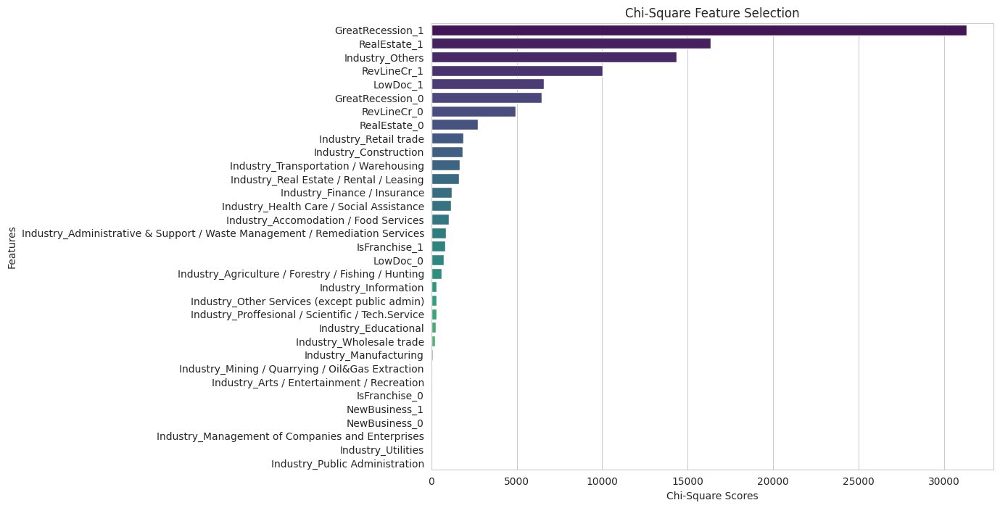

In [137]:
# create horizontal bar plot for chi-square scores
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='chi2_scores', y='Features', data=chi2_results, palette='viridis')

# set title and labels
ax.set_title('Chi-Square Feature Selection')
ax.set_xlabel('Chi-Square Scores')
ax.set_ylabel('Features')

# show the plot
plt.show()

In [138]:
# create a SelectKBest object
selector = SelectKBest(chi2, k=5)

# fit selector to data
selector.fit(X, y)

# get selected features
selected_features = X.columns[selector.get_support()]

# display selected features
print('Selected features:', list(selected_features))

Selected features: ['Industry_Others', 'RevLineCr_1', 'LowDoc_1', 'RealEstate_1', 'GreatRecession_1']


In [139]:
df_n.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 569159 entries, 0 to 899163
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   State               569159 non-null  object 
 1   BankState           569159 non-null  object 
 2   ApprovalFY          569159 non-null  float32
 3   Term                569159 non-null  float64
 4   NoEmp               569159 non-null  float64
 5   CreateJob           569159 non-null  float64
 6   RetainedJob         569159 non-null  float64
 7   UrbanRural          569159 non-null  int8   
 8   RevLineCr           569159 non-null  int8   
 9   LowDoc              569159 non-null  int8   
 10  DisbursementGross   569159 non-null  float64
 11  GrAppv              569159 non-null  float64
 12  Industry            569159 non-null  object 
 13  Default             569159 non-null  int8   
 14  IsFranchise         569159 non-null  int8   
 15  NewBusiness         569159 non-nul

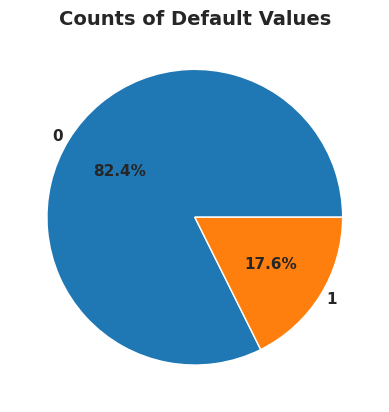

In [140]:
fig, ax = plt.subplots()
data = df_n.Default.value_counts()
ax.pie(data, labels=data.index, autopct='%1.1f%%', labeldistance=1.05, textprops={'fontsize': 11, 'weight': 'bold'})
ax.set_title('Counts of Default Values', fontsize=14, fontweight='bold')
    
plt.show()